# ***Libraries***

In [68]:
# Data Manipulation
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [69]:
# Preprocessing and Imputation
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer

In [70]:
# Model Selection and Evaluation Metrics
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_score, recall_score, f1_score

In [71]:
# Machine Learning Models
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import torch
import torch.nn as nn

In [72]:
# Resampling Techniques
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import NearMiss

# ***Introduction***

In [73]:
# We import the data and drop the observation that has negative age, then reset index
df = pd.read_csv("train.csv")
df.drop(5005,inplace=True)
df.reset_index(inplace=True)

In [75]:
# We remove the columns that repeat the index
df.drop(columns=["Unnamed: 0","index"],inplace=True)

In [76]:
# Separating real estate and non real estate loans with a new feature "NumberNonRealEstateLoansOrLines" replacing "NumberOfOpenCreditLinesAndLoans"
df["NumberOfOpenCreditLinesAndLoans"] = df['NumberOfOpenCreditLinesAndLoans']-df['NumberRealEstateLoansOrLines']
df.rename(columns={'NumberOfOpenCreditLinesAndLoans': 'NumberNonRealEstateLoansOrLines'},inplace=True)

In [77]:
# Quick look at the data
df.describe()

,SeriousDlqin2yrs,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberNonRealEstateLoansOrLines,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
count,112499.000000,112499.000000,112499.000000,112499.000000,112499.000000,9.031200e+04,112499.000000,112499.000000,112499.000000,112499.000000,109554.000000
mean,0.066845,6.264249,52.468573,0.421346,353.836220,6.328080e+03,7.444751,0.266767,1.018222,0.240678,0.757654
std,0.249755,259.630969,14.798620,4.196468,2153.230263,1.413422e+04,4.770808,4.173056,1.133213,4.158773,1.114823
min,0.000000,0.000000,20.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.029677,41.000000,0.000000,0.175078,3.227136e+03,4.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.153515,52.000000,0.000000,0.366291,5.112446e+03,7.000000,0.000000,1.000000,0.000000,0.000000
75%,0.000000,0.558293,63.000000,0.000000,0.857619,7.812569e+03,10.000000,0.000000,2.000000,0.000000,1.000000
max,1.000000,50708.000000,103.000000,98.000000,329664.000000,2.866006e+06,57.000000,98.000000,54.000000,98.000000,20.000000


In [78]:
# Quick check for missing values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112499 entries, 0 to 112498
Data columns (total 11 columns):
 #   Column                                Non-Null Count   Dtype  
---  ------                                --------------   -----  
 0   SeriousDlqin2yrs                      112499 non-null  float64
 1   RevolvingUtilizationOfUnsecuredLines  112499 non-null  float64
 2   age                                   112499 non-null  float64
 3   NumberOfTime30-59DaysPastDueNotWorse  112499 non-null  float64
 4   DebtRatio                             112499 non-null  float64
 5   MonthlyIncome                         90312 non-null   float64
 6   NumberNonRealEstateLoansOrLines       112499 non-null  float64
 7   NumberOfTimes90DaysLate               112499 non-null  float64
 8   NumberRealEstateLoansOrLines          112499 non-null  float64
 9   NumberOfTime60-89DaysPastDueNotWorse  112499 non-null  float64
 10  NumberOfDependents                    109554 non-null  float64
dtype

# ***Exploratory data analysis***

## SeriousDlqin2yrs

In [79]:
df['SeriousDlqin2yrs'].value_counts()/len(df['SeriousDlqin2yrs'])
#Imbalanced classes

SeriousDlqin2yrs
0.0    0.933155
1.0    0.066845
Name: count, dtype: float64

## RevolvingUtilizationOfUnsecuredLines

97.775% of the observations report values below 1
The remaining values are spread across an extremely wide range


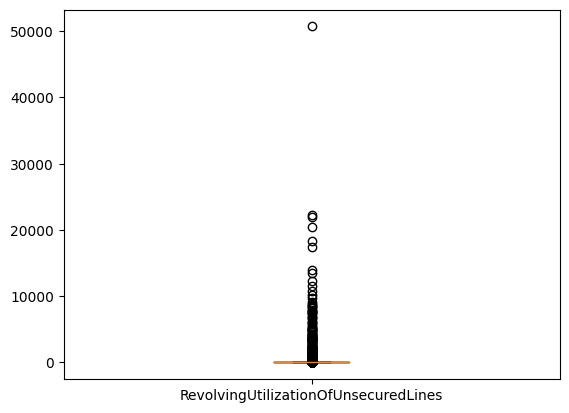

In [81]:
# Boxplot of RevolvingUtilizationOfUnsecuredLines
plt.boxplot(df["RevolvingUtilizationOfUnsecuredLines"])
plt.xticks([1], [df["RevolvingUtilizationOfUnsecuredLines"].name])
print(f"{(len(df[df['RevolvingUtilizationOfUnsecuredLines']<=1])/len(df))*100:.3f}% of the observations report values below 1")
print(f"The remaining values are spread across an extremely wide range")

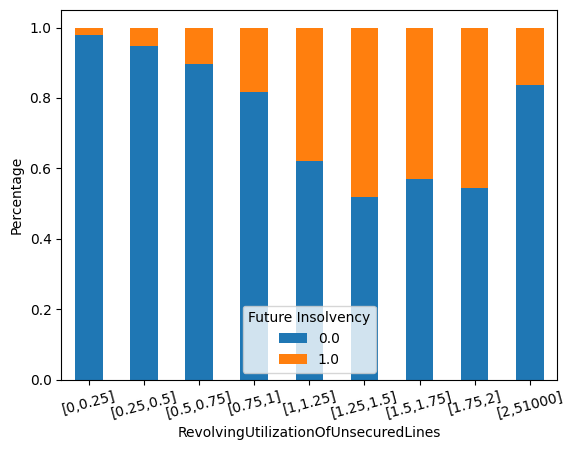

In each bin there are the following number of observations
SeriousDlqin2yrs    0.0   1.0
interval                     
[0.0, 0.25)       64372  1402
[0.25, 0.5)       14951   825
[0.5, 0.75)        9318  1080
[0.75, 1.0)       14751  3285
[1.0, 1.25)        1120   682
[1.25, 1.5)         131   121
[1.5, 1.75)          65    49
[1.75, 2.0)          36    30
[2.0, 51000.0)      235    46


In [82]:
#Plotting the "risk" of future insolvency for observations with different values of RevolvingUtilizationOfUnsecuredLines
copy = df.copy()
copy['interval'] = pd.cut(df['RevolvingUtilizationOfUnsecuredLines'], bins=[0,0.25,0.5,0.75,1,1.25,1.5,1.75,2, 51000], right=False)
grouped = copy.groupby(['interval', 'SeriousDlqin2yrs'])
counts = grouped.size().unstack(fill_value=0)
proportions = counts.div(counts.sum(axis=1), axis=0)
intervals = [(0, 0.25),(0.25,0.5),(0.5, 0.75),(0.75,1),(1, 1.25),(1.25,1.5),(1.5, 1.75),(1.75, 2), (2, 51000)]
proportions.plot(kind='bar', stacked=True)
plt.xlabel('RevolvingUtilizationOfUnsecuredLines')
plt.ylabel('Percentage')
plt.xticks(range(len(intervals)), [f'[{interval[0]},{interval[1]}]' for interval in intervals],rotation=15)
plt.legend(title='Future Insolvency',loc='lower center')
plt.show()
print("In each bin there are the following number of observations")
print(counts)

## Age

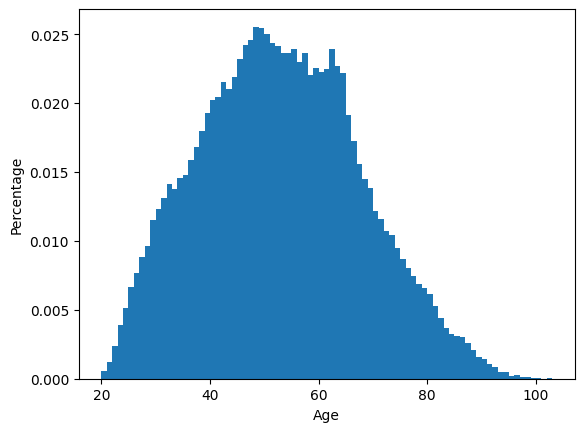

In [84]:
# Histogram of age
plt.hist(df["age"],bins=83,density=True)
plt.xlabel("Age")
plt.ylabel("Percentage")
plt.show()

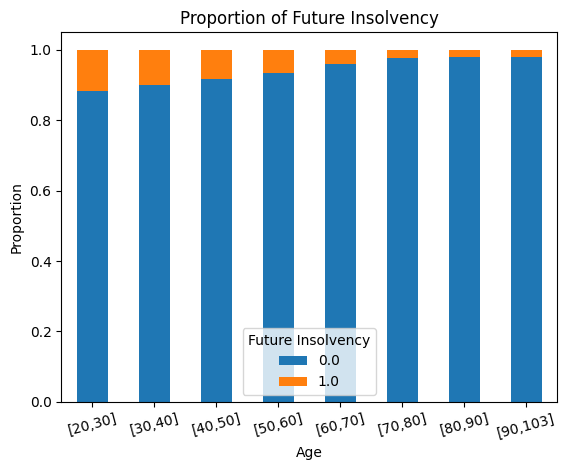

In each bin there are the following number of observations
SeriousDlqin2yrs    0.0   1.0
interval                     
[20, 30)           5722   752
[30, 40)          15451  1723
[40, 50)          23559  2090
[50, 60)          24767  1767
[60, 70)          20945   849
[70, 80)          10094   252
[80, 90)           3881    75
[90, 103)           559    12


In [85]:
#Plotting the "risk" of future insolvency for observations with different values of Age
copy = df.copy()
copy['interval'] = pd.cut(df['age'], bins=[20,30,40,50,60,70,80,90, 103], right=False)
grouped = copy.groupby(['interval', 'SeriousDlqin2yrs'])
counts = grouped.size().unstack(fill_value=0)
proportions = counts.div(counts.sum(axis=1), axis=0)
intervals = [(20, 30),(30,40),(40,50),(50,60),(60,70),(70,80),(80,90),(90, 103)]
proportions.plot(kind='bar', stacked=True)
plt.title('Proportion of Future Insolvency')
plt.xlabel('Age')
plt.ylabel('Proportion')
plt.xticks(range(len(intervals)), [f'[{interval[0]},{interval[1]}]' for interval in intervals],rotation=15)
plt.legend(title='Future Insolvency',loc='lower center')
plt.show()
print("In each bin there are the following number of observations")
print(counts)

## Past Insolvency: NumberOfTime30-59DaysPastDueNotWorse, NumberOfTime60-89DaysPastDueNotWorse and NumberOfTimes90DaysLate

In [86]:
# Counts for the variables related to past insolvency
insolvency3059 = df["NumberOfTime30-59DaysPastDueNotWorse"].value_counts().sort_index()
insolvency6089 = df["NumberOfTime60-89DaysPastDueNotWorse"].value_counts().sort_index()
insolvency90 = df["NumberOfTimes90DaysLate"].value_counts().sort_index()
print("Counts of past insolvency")
print(insolvency3059,insolvency6089,insolvency90)

Counts of past insolvency
NumberOfTime30-59DaysPastDueNotWorse
0.0     94474
1.0     12076
2.0      3447
3.0      1330
4.0       535
5.0       252
6.0       104
7.0        41
8.0        22
9.0         8
10.0        4
11.0        1
12.0        2
13.0        1
96.0        1
98.0      201
Name: count, dtype: int64 NumberOfTime60-89DaysPastDueNotWorse
0.0     106774
1.0       4330
2.0        828
3.0        241
4.0         78
5.0         27
6.0         11
7.0          7
11.0         1
96.0         1
98.0       201
Name: count, dtype: int64 NumberOfTimes90DaysLate
0.0     106203
1.0       3956
2.0       1170
3.0        516
4.0        230
5.0         89
6.0         59
7.0         27
8.0         15
9.0         14
10.0         6
11.0         3
12.0         1
13.0         3
14.0         2
15.0         2
17.0         1
96.0         1
98.0       201
Name: count, dtype: int64


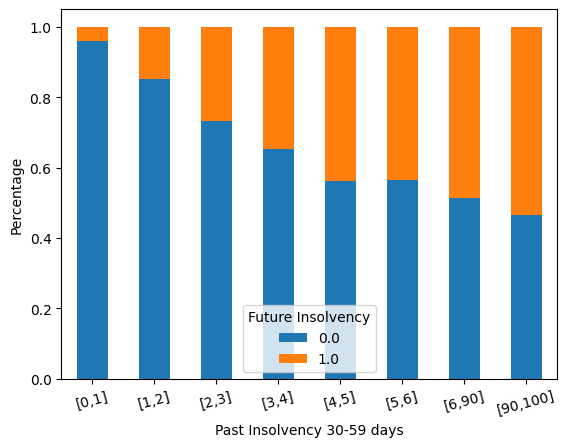

In each bin there are the following number of observations
SeriousDlqin2yrs    0.0   1.0
interval                     
[0, 1)            90661  3813
[1, 2)            10292  1784
[2, 3)             2528   919
[3, 4)              867   463
[4, 5)              301   234
[5, 6)              142   110
[6, 90)              94    89
[90, 100)            94   108


In [87]:
#Plotting the "risk" of future insolvency for observations with different values of NumberOfTime30-59DaysPastDueNotWorse
copy = df.copy()
copy['interval'] = pd.cut(df['NumberOfTime30-59DaysPastDueNotWorse'], bins=[0,1,2,3,4,5,6,90,100], right=False)
grouped = copy.groupby(['interval', 'SeriousDlqin2yrs'])
counts = grouped.size().unstack(fill_value=0)
proportions = counts.div(counts.sum(axis=1), axis=0)
intervals = [(0,1),(1,2),(2,3),(3,4),(4,5),(5,6),(6,90),(90, 100)]
proportions.plot(kind='bar', stacked=True)
plt.xlabel('Past Insolvency 30-59 days')
plt.ylabel('Percentage')
plt.xticks(range(len(intervals)), [f'[{interval[0]},{interval[1]}]' for interval in intervals],rotation=15)
plt.legend(title='Future Insolvency',loc='lower center')
plt.show()
print("In each bin there are the following number of observations")
print(counts)

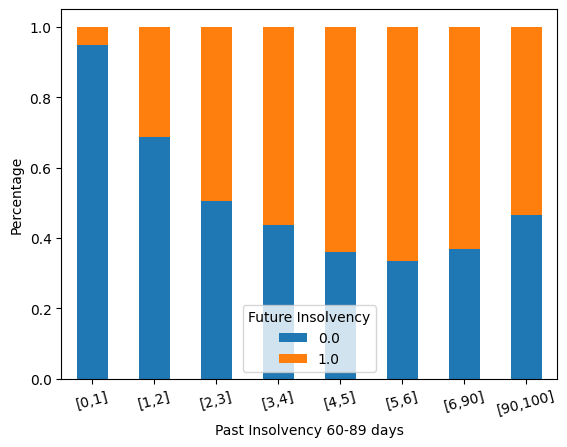

In each bin there are the following number of observations
SeriousDlqin2yrs     0.0   1.0
interval                      
[0, 1)            101339  5435
[1, 2)              2978  1352
[2, 3)               419   409
[3, 4)               105   136
[4, 5)                28    50
[5, 6)                 9    18
[6, 90)                7    12
[90, 100)             94   108


In [88]:
#Plotting the "risk" of future insolvency for observations with different values of NumberOfTime60-89DaysPastDueNotWorse
copy = df.copy()
copy['interval'] = pd.cut(df['NumberOfTime60-89DaysPastDueNotWorse'], bins=[0,1,2,3,4,5,6,90,100], right=False)
grouped = copy.groupby(['interval', 'SeriousDlqin2yrs'])
counts = grouped.size().unstack(fill_value=0)
proportions = counts.div(counts.sum(axis=1), axis=0)
intervals = [(0,1),(1,2),(2,3),(3,4),(4,5),(5,6),(6,90),(90, 100)]
proportions.plot(kind='bar', stacked=True)
plt.xlabel('Past Insolvency 60-89 days')
plt.ylabel('Percentage')
plt.xticks(range(len(intervals)), [f'[{interval[0]},{interval[1]}]' for interval in intervals],rotation=15)
plt.legend(title='Future Insolvency',loc='lower center')
plt.show()
print("In each bin there are the following number of observations")
print(counts)

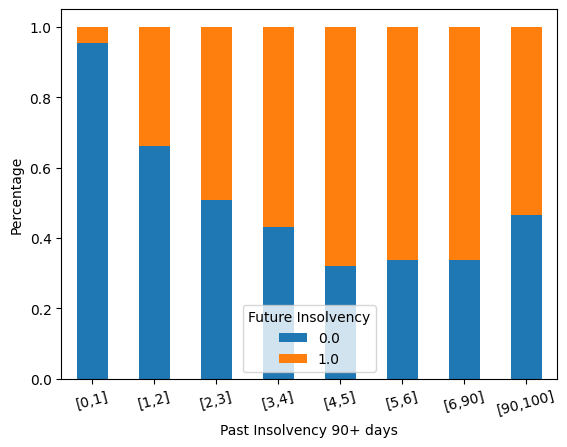

In each bin there are the following number of observations
SeriousDlqin2yrs     0.0   1.0
interval                      
[0, 1)            101304  4899
[1, 2)              2615  1341
[2, 3)               594   576
[3, 4)               223   293
[4, 5)                74   156
[5, 6)                30    59
[6, 90)               45    88
[90, 100)             94   108


In [89]:
#Plotting the "risk" of future insolvency for observations with different values of NumberOfTimes90DaysLate
copy = df.copy()
copy['interval'] = pd.cut(df['NumberOfTimes90DaysLate'], bins=[0,1,2,3,4,5,6,90,100], right=False)
grouped = copy.groupby(['interval', 'SeriousDlqin2yrs'])
counts = grouped.size().unstack(fill_value=0)
proportions = counts.div(counts.sum(axis=1), axis=0)
intervals = [(0,1),(1,2),(2,3),(3,4),(4,5),(5,6),(6,90),(90, 100)]
proportions.plot(kind='bar', stacked=True)
plt.xlabel('Past Insolvency 90+ days')
plt.ylabel('Percentage')
plt.xticks(range(len(intervals)), [f'[{interval[0]},{interval[1]}]' for interval in intervals],rotation=15)
plt.legend(title='Future Insolvency',loc='lower center')
plt.show()
print("In each bin there are the following number of observations")
print(counts)

## DebtRatio

76.695% of the observations report values below 1
4.168% of the observations report values between 1 and 10
The remaining values are spread across an extremely wide range
89.388% of the observations reporting values higher than 2 do not have the income


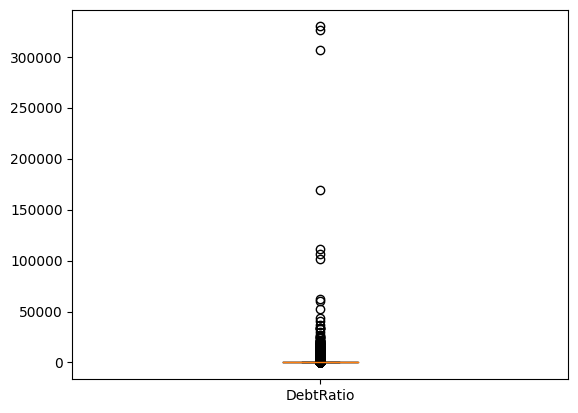

In [92]:
# Boxplot of DebtRatio
plt.boxplot(df["DebtRatio"])
plt.xticks([1], [df["DebtRatio"].name])
print(f"{(len(df[df['DebtRatio']<=1])/len(df))*100:.3f}% of the observations report values below 1")
print(f"{(len(df[(df['DebtRatio']<=10)&(df['DebtRatio']>1)])/len(df))*100:.3f}% of the observations report values between 1 and 10")
a = len(df[(df['DebtRatio'] > 2)&(df['MonthlyIncome'].isna())])
b = len(df[df["DebtRatio"]>2])
print(f"The remaining values are spread across an extremely wide range")
print(f"{(a/b)*100:.3f}% of the observations reporting values higher than 2 do not have the income")

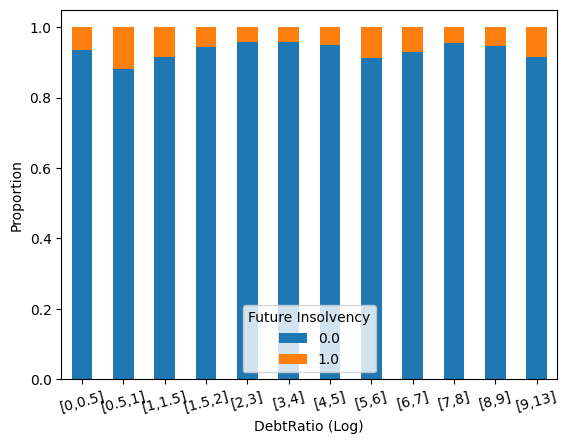

In each bin there are the following number of observations
SeriousDlqin2yrs    0.0   1.0
interval                     
[0.0, 0.5)        73884  5023
[0.5, 1.0)         8893  1183
[1.0, 1.5)          947    86
[1.5, 2.0)          502    30
[2.0, 3.0)         1062    47
[3.0, 4.0)         1501    66
[4.0, 5.0)         1557    82
[5.0, 6.0)         1509   144
[6.0, 7.0)         3591   266
[7.0, 8.0)         7790   373
[8.0, 9.0)         3512   199
[9.0, 13.0)         231    21


In [93]:
#Plotting the "risk" of future insolvency for observations with different values of DebtRatio
copy = df.copy()
copy['interval'] = pd.cut(np.log(df['DebtRatio']+1), bins=[0,0.5,1,1.5,2,3,4,5,6,7,8,9,13], right=False)
grouped = copy.groupby(['interval', 'SeriousDlqin2yrs'])
counts = grouped.size().unstack(fill_value=0)
proportions = counts.div(counts.sum(axis=1), axis=0)
intervals = [(0,0.5),(0.5,1),(1,1.5),(1.5,2),(2,3),(3,4),(4,5),(5,6),(6,7),(7,8),(8,9),(9,13)]
proportions.plot(kind='bar', stacked=True)
plt.xlabel("DebtRatio (Log)")
plt.ylabel('Proportion')
plt.xticks(range(len(intervals)), [f'[{interval[0]},{interval[1]}]' for interval in intervals],rotation=15)
plt.legend(title='Future Insolvency',loc='lower center')
plt.show()
print("In each bin there are the following number of observations")
print(counts)

## MonthlyIncome

19.722% of the observations don't report the income
93.167% of the observations that don't report the income have a DebtRatio higher than 2


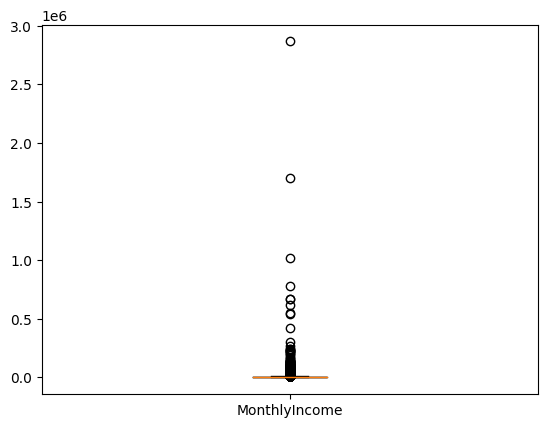

In [95]:
# Boxplot of MonthlyIncome
plt.boxplot(df["MonthlyIncome"].dropna())
plt.xticks([1], [df["MonthlyIncome"].name])
not_missing = df.dropna()
missing_income = df[df["MonthlyIncome"].isna()]
print(f"{(1-len(not_missing)/len(df))*100:.3f}% of the observations don't report the income")
print(f"{len(missing_income[missing_income['DebtRatio']>2])/len(missing_income)*100:.3f}% of the observations that don't report the income have a DebtRatio higher than 2")


Text(0.5, 0, 'MonthlyIncome (Log)')

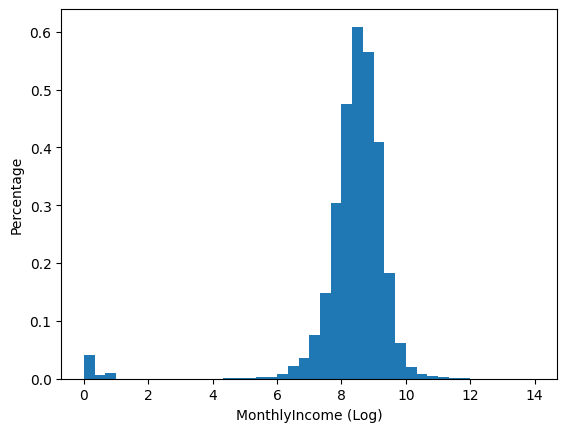

In [96]:
# Histogram of MonthlyIncome
plt.hist(np.log(df["MonthlyIncome"]+1),bins=list(np.linspace(0,14,43)),density=True)
plt.ylabel("Percentage")
plt.xlabel("MonthlyIncome (Log)")

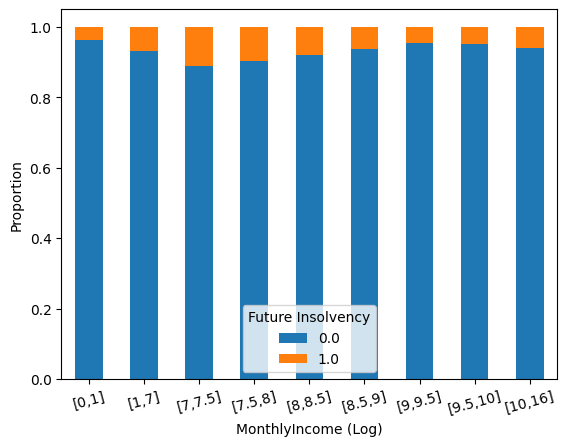

In each bin there are the following number of observations
SeriousDlqin2yrs    0.0   1.0
interval                     
[0.0, 1.0)         1630    62
[1.0, 7.0)         2092   156
[7.0, 7.5)         3419   425
[7.5, 8.0)        10865  1173
[8.0, 8.5)        21507  1896
[8.5, 9.0)        24664  1616
[9.0, 9.5)        15084   713
[9.5, 10.0)        3718   185
[10.0, 16.0)       1042    65


In [97]:
#Plotting the "risk" of future insolvency for observations with different values of MonthlyIncome
copy = df.copy()
copy['interval'] = pd.cut(np.log(df['MonthlyIncome']+1), bins=[0,1,7,7.5,8,8.5,9,9.5,10,16], right=False)
grouped = copy.groupby(['interval', 'SeriousDlqin2yrs'])
counts = grouped.size().unstack(fill_value=0)
proportions = counts.div(counts.sum(axis=1), axis=0)
intervals = [(0,1),(1,7),(7,7.5),(7.5,8),(8,8.5),(8.5,9),(9,9.5),(9.5,10),(10,16)]
proportions.plot(kind='bar', stacked=True)
plt.xlabel('MonthlyIncome (Log)')
plt.ylabel('Proportion')
plt.xticks(range(len(intervals)), [f'[{interval[0]},{interval[1]}]' for interval in intervals],rotation=15)
plt.legend(title='Future Insolvency',loc='lower center')
plt.show()
print("In each bin there are the following number of observations")
print(counts)

## NumberNonRealEstateLoansOrLines and NumberRealEstateLoansOrLines

Text(0, 0.5, 'Percentage')

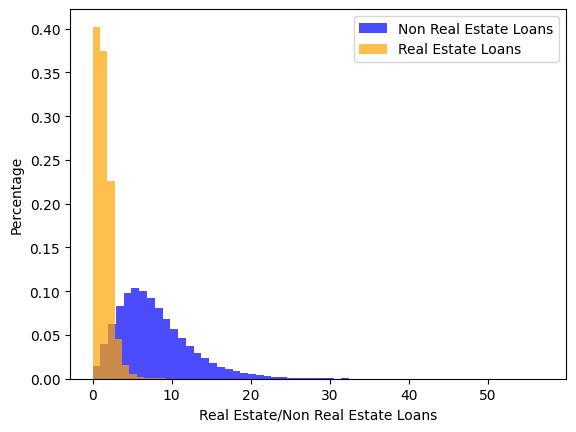

In [98]:
# Histogram of NumberNonRealEstateLoansOrLines and NumberRealEstateLoansOrLines
plt.hist(df['NumberNonRealEstateLoansOrLines'], bins=58, color='blue', density=True, alpha=0.7, label='Non Real Estate Loans')
plt.hist(df['NumberRealEstateLoansOrLines'], bins=58, color='orange', density=True, alpha=0.7, label='Real Estate Loans')
plt.legend()
plt.xlabel("Real Estate/Non Real Estate Loans")
plt.ylabel("Percentage")

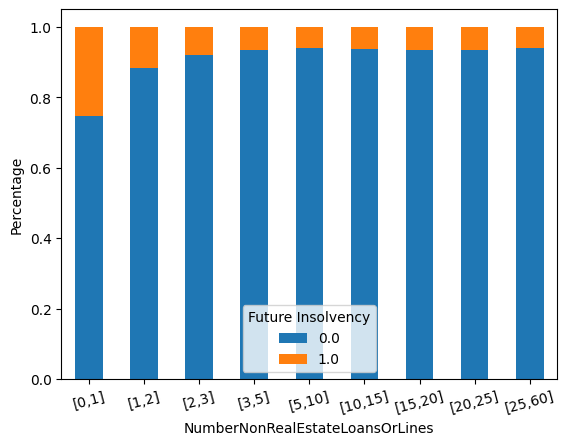

In each bin there are the following number of observations
SeriousDlqin2yrs    0.0   1.0
interval                     
[0, 1)             1244   423
[1, 2)             3851   510
[2, 3)             6348   557
[3, 5)            18736  1280
[5, 10)           46231  2864
[10, 15)          20094  1304
[15, 20)           6140   422
[20, 25)           1700   120
[25, 60)            635    40


In [99]:
#Plotting the "risk" of future insolvency for observations with different values of NumberNonRealEstateLoansOrLines
copy = df.copy()
copy['interval'] = pd.cut(df['NumberNonRealEstateLoansOrLines'], bins=[0,1,2,3,5,10,15,20,25,60], right=False)
grouped = copy.groupby(['interval', 'SeriousDlqin2yrs'])
counts = grouped.size().unstack(fill_value=0)
proportions = counts.div(counts.sum(axis=1), axis=0)
intervals = [(0,1),(1,2),(2,3),(3,5),(5,10),(10,15),(15,20),(20,25),(25,60)]
proportions.plot(kind='bar', stacked=True)
plt.xlabel("NumberNonRealEstateLoansOrLines")
plt.ylabel('Percentage')
plt.xticks(range(len(intervals)), [f'[{interval[0]},{interval[1]}]' for interval in intervals],rotation=15)
plt.legend(title='Future Insolvency',loc='lower center')
plt.show()
print("In each bin there are the following number of observations")
print(counts)

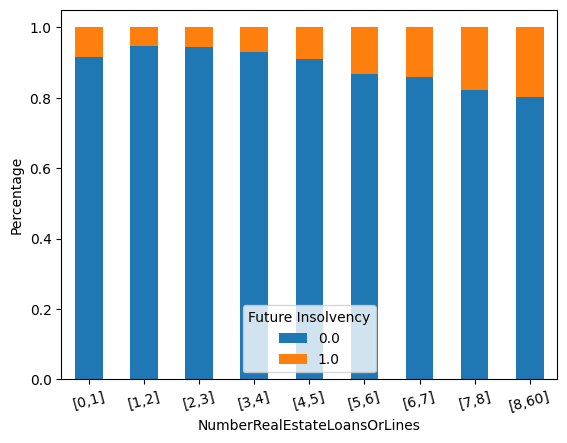

In each bin there are the following number of observations
SeriousDlqin2yrs    0.0   1.0
interval                     
[0, 1)            38637  3495
[1, 2)            37200  2055
[2, 3)            22348  1328
[3, 4)             4380   329
[4, 5)             1459   142
[5, 6)              461    70
[6, 7)              209    34
[7, 8)              110    24
[8, 60)             175    43


In [100]:
#Plotting the "risk" of future insolvency for observations with different values of NumberRealEstateLoansOrLines
copy = df.copy()
copy['interval'] = pd.cut(df['NumberRealEstateLoansOrLines'], bins=[0,1,2,3,4,5,6,7,8,60], right=False)
grouped = copy.groupby(['interval', 'SeriousDlqin2yrs'])
counts = grouped.size().unstack(fill_value=0)
proportions = counts.div(counts.sum(axis=1), axis=0)
intervals = [(0,1),(1,2),(2,3),(3,4),(4,5),(5,6),(6,7),(7,8),(8,60)]
proportions.plot(kind='bar', stacked=True)
plt.xlabel("NumberRealEstateLoansOrLines")
plt.ylabel('Percentage')
plt.xticks(range(len(intervals)), [f'[{interval[0]},{interval[1]}]' for interval in intervals],rotation=15)
plt.legend(title='Future Insolvency',loc='lower center')
plt.show()
print("In each bin there are the following number of observations")
print(counts)

## NumberOfDependents

In [102]:
#Counts of NumberOfDependents
print(f"{len(df[df['NumberOfDependents'].isna()])/len(df)*100:.3f}% of the observations don't report the NumberOfDependents")
print("Counts of non-missing values")
df['NumberOfDependents'].value_counts().sort_index()

2.618% of the observations don't report the NumberOfDependents
Counts of non-missing values


NumberOfDependents
0.0     65107
1.0     19817
2.0     14643
3.0      7083
4.0      2166
5.0       555
6.0       119
7.0        38
8.0        17
9.0         3
10.0        5
20.0        1
Name: count, dtype: int64

Text(0, 0.5, 'Percentage')

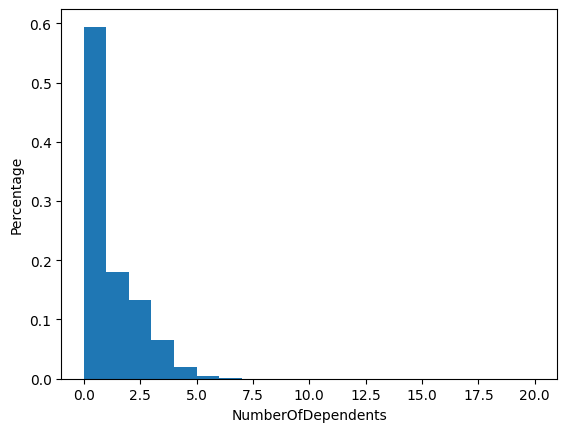

In [103]:
# Histogram of non missing values of NumberOfDependents
plt.hist(df['NumberOfDependents'],bins=20,density=True)
plt.xlabel("NumberOfDependents")
plt.ylabel("Percentage")

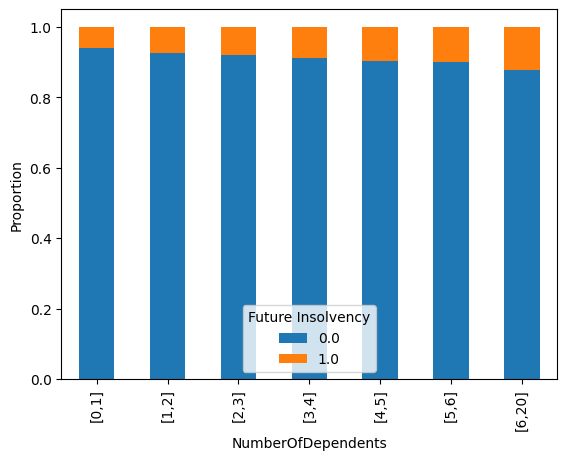

In each bin there are the following number of observations
SeriousDlqin2yrs    0.0   1.0
interval                     
[0, 1)            61280  3827
[1, 2)            18355  1462
[2, 3)            13458  1185
[3, 4)             6456   627
[4, 5)             1955   211
[5, 6)              500    55
[6, 20)             160    22


In [104]:
#Plotting the "risk" of future insolvency for observations with different values of NumberOfDependents
copy = df.copy()
copy['interval'] = pd.cut(copy['NumberOfDependents'], bins=[0,1,2,3,4,5,6,20], right=False)
grouped = copy.groupby(['interval', 'SeriousDlqin2yrs'])
counts = grouped.size().unstack(fill_value=0)
proportions = counts.div(counts.sum(axis=1), axis=0)
intervals = [(0,1),(1,2),(2,3),(3,4),(4,5),(5,6),(6,20)]
proportions.plot(kind='bar', stacked=True)
plt.xlabel('NumberOfDependents')
plt.ylabel('Proportion')
plt.xticks(range(len(intervals)), [f'[{interval[0]},{interval[1]}]' for interval in intervals])
plt.legend(title='Future Insolvency',loc='lower center')
plt.show()
print("In each bin there are the following number of observations")
print(counts)

# ***Imputation***

## Preprocessing and Imputation

In [105]:
# Defining a custom function for rescaling and its inverse: only the values larger than the threshold will be rescaled using the logarithm
def replace_values_log(original,threshold):
    if original > threshold:
        return  np.log(np.exp(threshold) + original - threshold)
    else:
        return original

def inverse_replace_values_log(transformed, threshold):
    if transformed <= threshold:
        return transformed
    else:
        return np.exp(transformed) + threshold - np.exp(threshold)

In [106]:
# Dropping target, applying custom rescaling to RevolvingUtilizationOfUnsecuredLines and DebtRatio, and just the logarithm to MonthlyIncome
df_imputation = df.copy().drop(columns="SeriousDlqin2yrs")
df_imputation['RevolvingUtilizationOfUnsecuredLines'] = df_imputation['RevolvingUtilizationOfUnsecuredLines'].apply(replace_values_log,args=(2,))
df_imputation["DebtRatio"] = df_imputation["DebtRatio"].apply(replace_values_log,args=(2,))
df_imputation["MonthlyIncome"] = np.log(df_imputation["MonthlyIncome"]+1)

In [107]:
# Bringing all the features within the same range
scaler = MinMaxScaler(feature_range=(0,100))
df_imputation = pd.DataFrame(scaler.fit_transform(df_imputation),columns=df_imputation.columns,index=df_imputation.index)

In [ ]:
df_imputation.describe()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberNonRealEstateLoansOrLines,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents
count,112499.000000,112499.000000,112499.000000,112499.000000,90312.000000,112499.000000,112499.000000,112499.000000,112499.000000,109554.000000
mean,3.073334,39.118763,0.429945,12.484519,56.222396,13.060966,0.272211,1.885597,0.245589,3.788269
std,4.264214,17.829663,4.282111,20.545145,8.943090,8.369839,4.258221,2.098542,4.243646,5.574113
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.273928,25.301205,0.000000,1.377930,54.341045,7.017544,0.000000,0.000000,0.000000,0.000000
50%,1.416985,38.554217,0.000000,2.882851,57.434637,12.280702,0.000000,1.851852,0.000000,0.000000
75%,5.153187,51.807229,0.000000,6.749800,60.286237,17.543860,0.000000,3.703704,0.000000,5.000000
max,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


In [108]:
# Performing imputation and saving indices of missing values
imputer = KNNImputer(n_neighbors=335,weights="distance")
missing_income_indices = df_imputation[df_imputation["MonthlyIncome"].isna()].index
missing_dependents_indices = df_imputation[df_imputation["NumberOfDependents"].isna()].index
df_imputed = pd.DataFrame(imputer.fit_transform(df_imputation),columns=df_imputation.columns,index=df_imputation.index)

In [109]:
# Applying inverse min max rescaling
df_imputed = pd.DataFrame(scaler.inverse_transform(df_imputed),columns=df_imputed.columns,index=df_imputed.index)

In [110]:
# Aplying inverse of custom rescaling
df_imputed['RevolvingUtilizationOfUnsecuredLines'] = df_imputed['RevolvingUtilizationOfUnsecuredLines'].apply(inverse_replace_values_log, args=(2,))
df_imputed['DebtRatio'] = df_imputed['DebtRatio'].apply(inverse_replace_values_log, args=(2,))
df_imputed["MonthlyIncome"] = np.exp(df_imputed["MonthlyIncome"])-1

In [111]:
# Adding back target
df_imputed["SeriousDlqin2yrs"] = df["SeriousDlqin2yrs"]

In [ ]:
# Saving dataset with imputed values
# df_imputed.to_csv("imputed_data_log.csv")

## Evaluation of imputed values

In [112]:
df_imputed.describe()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberNonRealEstateLoansOrLines,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,SeriousDlqin2yrs
count,112499.000000,112499.000000,112499.000000,112499.000000,1.124990e+05,112499.000000,112499.000000,112499.000000,112499.000000,112499.000000,112499.000000
mean,6.264249,52.468573,0.421346,353.836220,5.129441e+03,7.444751,0.266767,1.018222,0.240678,0.744580,0.066845
std,259.630969,14.798620,4.196468,2153.230263,1.290036e+04,4.770808,4.173056,1.133213,4.158773,1.103681,0.249755
min,0.000000,20.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.029677,41.000000,0.000000,0.175078,1.697892e+03,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.153515,52.000000,0.000000,0.366291,4.185235e+03,7.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,0.558293,63.000000,0.000000,0.857619,7.023842e+03,10.000000,0.000000,2.000000,0.000000,1.000000,0.000000
max,50708.000000,103.000000,98.000000,329664.000000,2.866006e+06,57.000000,98.000000,54.000000,98.000000,20.000000,1.000000


Text(0, 0.5, 'Counts')

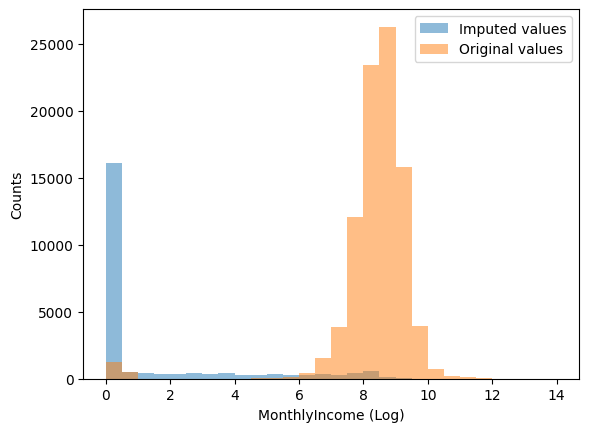

In [119]:
# Histogram of MonthlyIncome
plt.hist(np.log(df_imputed.loc[missing_income_indices,"MonthlyIncome"]+1),density=False,bins=list(np.linspace(0,14,29)), alpha=0.5, label='Imputed values')
plt.hist(np.log(df["MonthlyIncome"]+1),density=False,bins=list(np.linspace(0,14,29)), alpha=0.5, label='Original values')
plt.legend()
plt.xlabel("MonthlyIncome (Log)")
plt.ylabel("Counts")

Text(0, 0.5, 'Percentage')

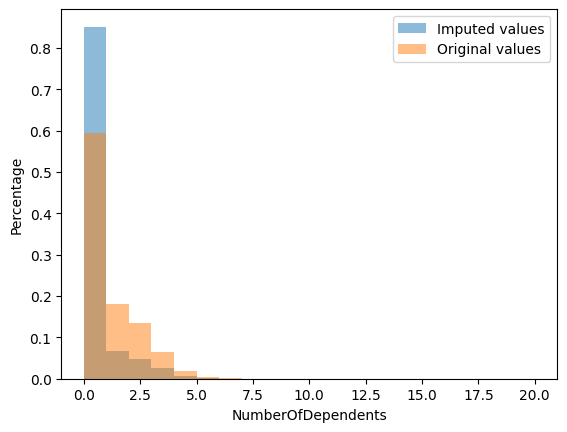

In [120]:
# Histogram of NumberOfDependents
plt.hist(df_imputed.loc[missing_income_indices,"NumberOfDependents"],density=True,bins=[0,1,2,3,4,5,6,7,8,10,20], alpha=0.5, label='Imputed values')
plt.hist(df["NumberOfDependents"],density=True,bins=[0,1,2,3,4,5,6,7,8,10,20], alpha=0.5, label='Original values')
plt.legend()
plt.xlabel("NumberOfDependents")
plt.ylabel("Percentage")

# ***Models***

In [121]:
# Seprate target from features
X = df_imputed.drop(columns="SeriousDlqin2yrs")
y = df_imputed["SeriousDlqin2yrs"]

## Features Selection

### Correlation Analysis

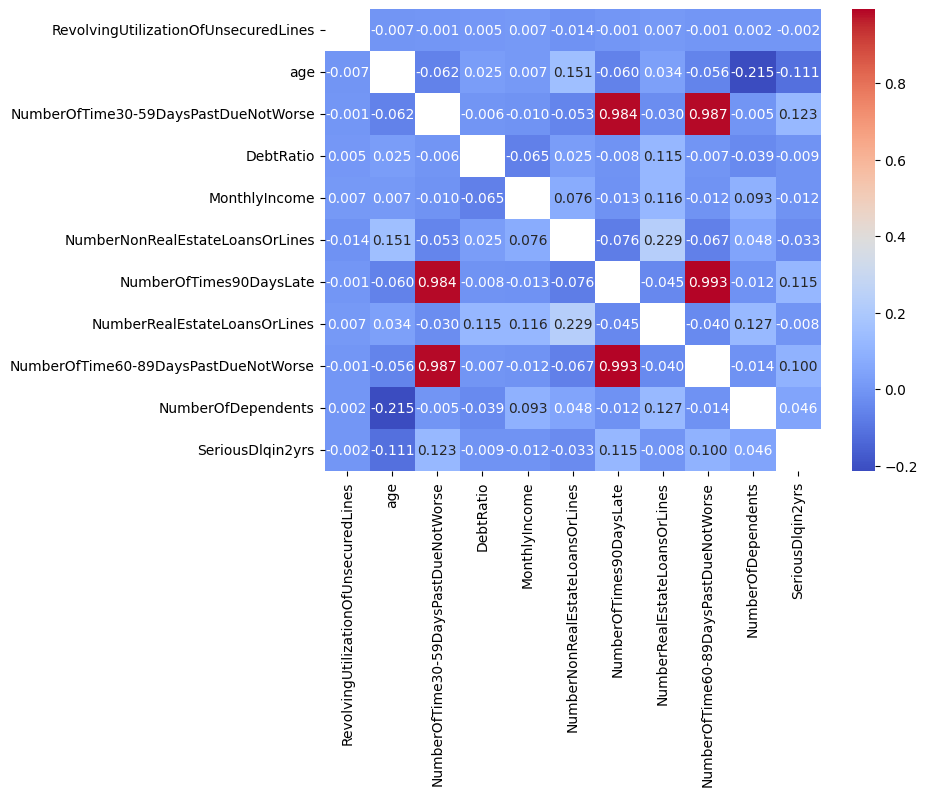

In [122]:
# Plotting linear correlation among variables
plt.figure(figsize=(8, 6))
corr_mat = df_imputed.corr()
np.fill_diagonal(corr_mat.values, np.nan)
sns.heatmap(corr_mat, annot=True, cmap='coolwarm', fmt=".3f")
plt.show()

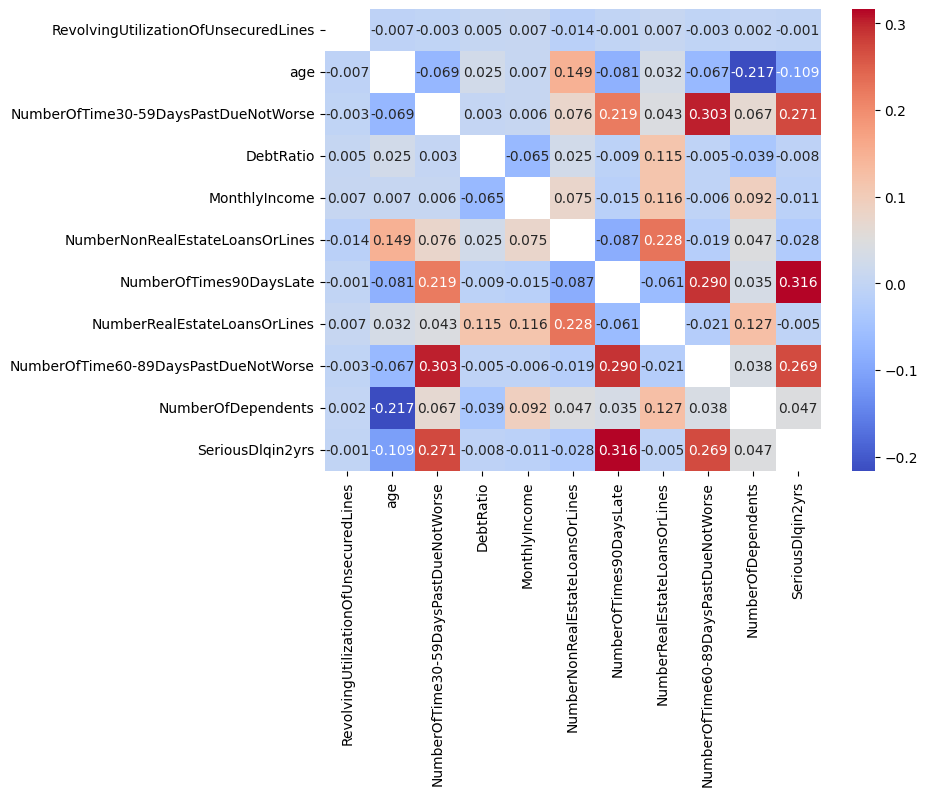

In [123]:
# Plotting linear correlation among variables excluding observations with 96/98 episodes of past insolvency
plt.figure(figsize=(8, 6))
corr_mat = df_imputed[df_imputed["NumberOfTimes90DaysLate"]<90].corr()
np.fill_diagonal(corr_mat.values, np.nan)
sns.heatmap(corr_mat, annot=True, cmap='coolwarm', fmt=".3f")
plt.show()

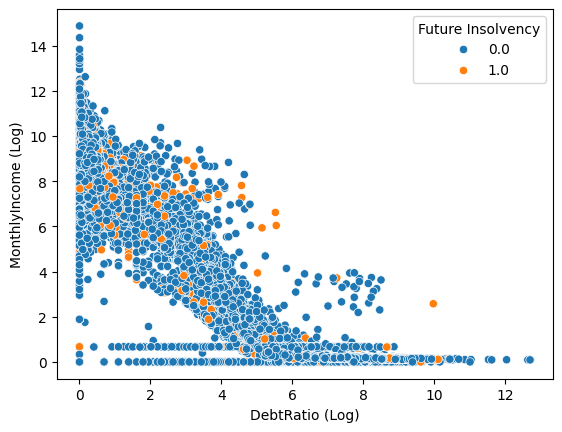

In [124]:
# Scatter plot of DebtRatio and MonthlyIncome
sns.scatterplot(x=np.log(df_imputed["DebtRatio"]+1),y=np.log(df_imputed["MonthlyIncome"]+1),hue=df_imputed["SeriousDlqin2yrs"])
plt.xlabel("DebtRatio (Log)")
plt.ylabel("MonthlyIncome (Log)")
plt.legend(title="Future Insolvency")


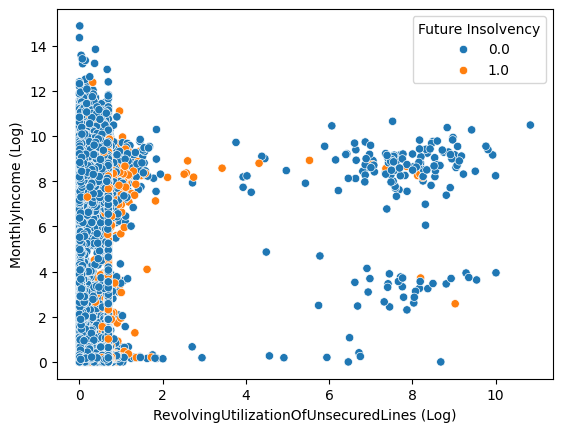

In [125]:
# Scatter plot of RevolvingUtilizationOfUnsecuredLines and MonthlyIncome
sns.scatterplot(x=np.log(df_imputed["RevolvingUtilizationOfUnsecuredLines"]+1),y=np.log(df_imputed["MonthlyIncome"]+1),hue=df_imputed["SeriousDlqin2yrs"])
plt.xlabel("RevolvingUtilizationOfUnsecuredLines (Log)")
plt.ylabel("MonthlyIncome (Log)")
plt.legend(title="Future Insolvency")

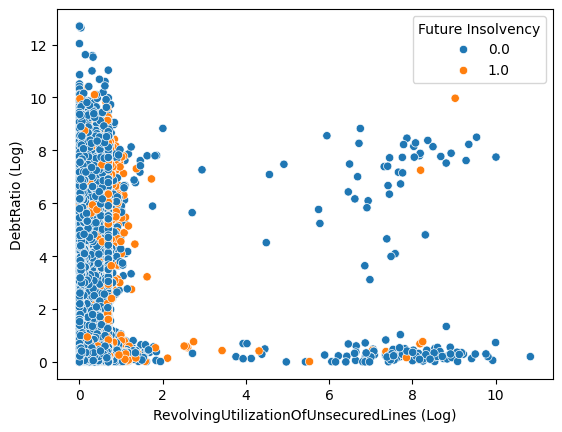

In [126]:
# Scatter plot of RevolvingUtilizationOfUnsecuredLines and DebtRatio
sns.scatterplot(x=np.log(df_imputed["RevolvingUtilizationOfUnsecuredLines"]+1),y=np.log(df_imputed["DebtRatio"]+1),hue=df_imputed["SeriousDlqin2yrs"])
plt.xlabel("RevolvingUtilizationOfUnsecuredLines (Log)")
plt.ylabel("DebtRatio (Log)")
plt.legend(title="Future Insolvency")

### Principal Component Analysis

In [127]:
# Defining a custom function for rescaling: only the values larger than the threshold will be rescaled using the logarithm
def replace_values_log(original,threshold):
    if original > threshold:
        return  np.log(np.exp(threshold) + original - threshold)
    else:
        return original

In [128]:
# Applying custom rescaling to RevolvingUtilizationOfUnsecuredLines and DebtRatio, and just the logarithm to MonthlyIncome
df_pca = df_imputed.copy()
df_pca['RevolvingUtilizationOfUnsecuredLines'] = df_pca['RevolvingUtilizationOfUnsecuredLines'].apply(replace_values_log,args=(2,))
df_pca["DebtRatio"] = df_pca["DebtRatio"].apply(replace_values_log,args=(2,))
df_pca["MonthlyIncome"] = np.log(df_pca["MonthlyIncome"]+1)

In [129]:
# Normalizing features before applying PCA
scaler = StandardScaler()
df_pca = pd.DataFrame(scaler.fit_transform(df_pca),columns=df_pca.columns,index=df_pca.index)

In [130]:
df_pca.describe()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberNonRealEstateLoansOrLines,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,SeriousDlqin2yrs
count,1.124990e+05,1.124990e+05,1.124990e+05,1.124990e+05,1.124990e+05,1.124990e+05,1.124990e+05,1.124990e+05,1.124990e+05,1.124990e+05,1.124990e+05
mean,-8.210789e-18,1.831638e-18,1.604262e-17,-1.524680e-16,9.481882e-17,5.627548e-17,2.008485e-17,4.402246e-17,3.536955e-18,-2.614821e-17,4.118027e-17
std,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00,1.000004e+00
min,-7.207302e-01,-2.194037e+00,-1.004053e-01,-6.076654e-01,-2.186157e+00,-1.560487e+00,-6.392629e-02,-8.985312e-01,-5.787254e-02,-6.746360e-01,-2.676441e-01
25%,-6.564913e-01,-7.749793e-01,-1.004053e-01,-5.405967e-01,1.416857e-01,-7.220508e-01,-6.392629e-02,-8.985312e-01,-5.787254e-02,-6.746360e-01,-2.676441e-01
50%,-3.884318e-01,-3.166343e-02,-1.004053e-01,-4.673469e-01,4.239368e-01,-9.322374e-02,-6.392629e-02,-1.608036e-02,-5.787254e-02,-6.746360e-01,-2.676441e-01
75%,4.877480e-01,7.116524e-01,-1.004053e-01,-2.791290e-01,5.859498e-01,5.356033e-01,-6.392629e-02,8.663705e-01,-5.787254e-02,2.314270e-01,-2.676441e-01
max,2.273036e+01,3.414619e+00,2.325267e+01,4.259686e+00,2.467327e+00,1.038723e+01,2.342017e+01,4.675382e+01,2.350687e+01,1.744662e+01,3.736305e+00


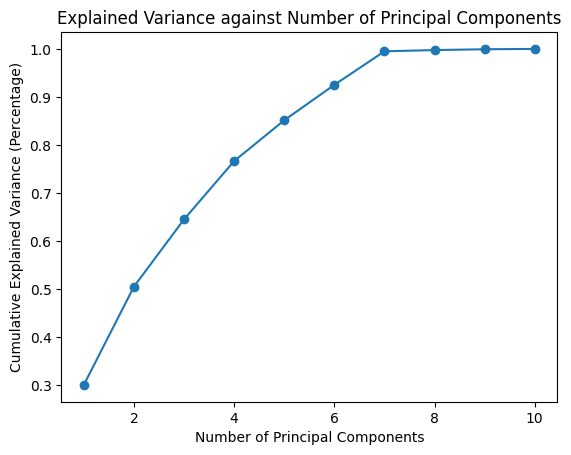

Cumulative explained variance: [0.30069101 0.50525859 0.64523361 0.76658281 0.85147464 0.92520635
 0.99501264 0.99761823 0.99932338 1.        ]


In [131]:
# Plotting the loss against the number of pricipal components
data_pca = df_pca.drop(columns="SeriousDlqin2yrs")
pca = PCA(n_components=10)
pca.fit(data_pca)
cumulative_explained_variance_ratio = np.cumsum(pca.explained_variance_ratio_)

plt.plot(range(1, len(cumulative_explained_variance_ratio) + 1), cumulative_explained_variance_ratio,'o-')
plt.title('Explained Variance against Number of Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance (Percentage)')
plt.show()
print(f"Cumulative explained variance: {cumulative_explained_variance_ratio}")

## Random Forest



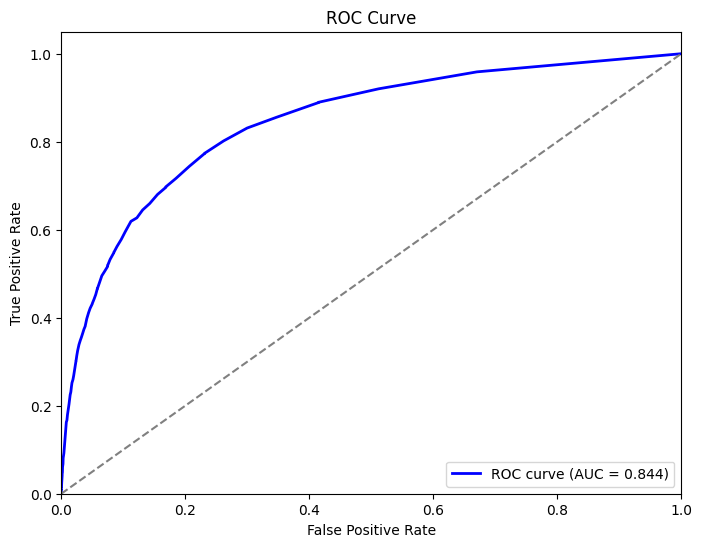

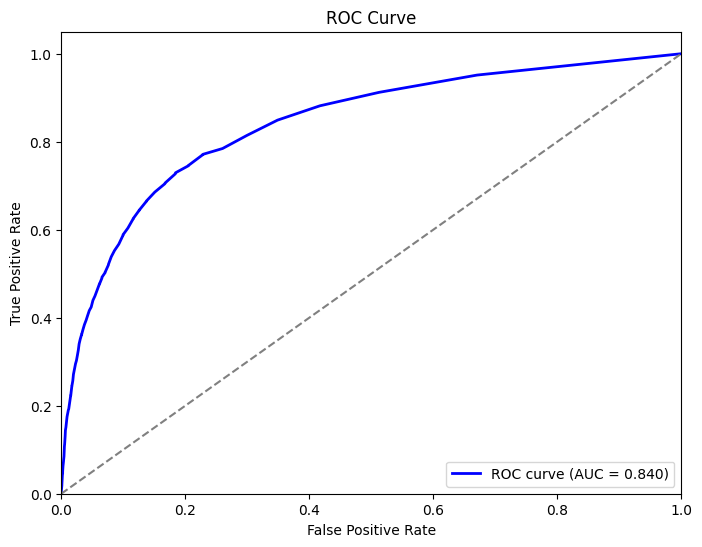

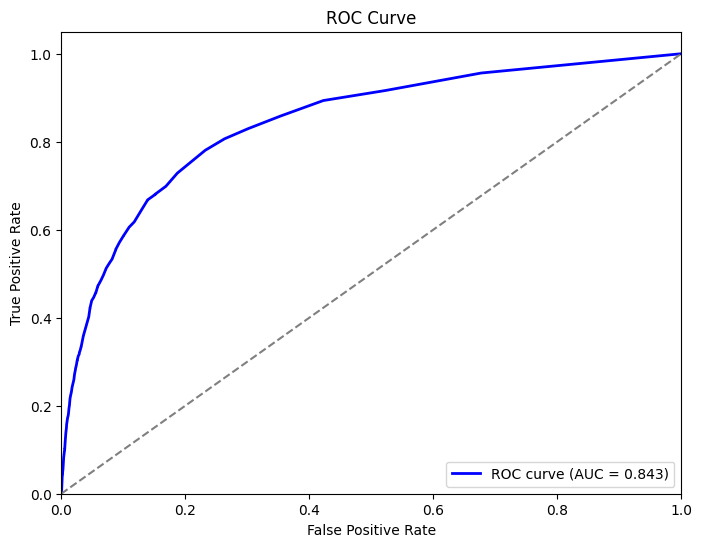

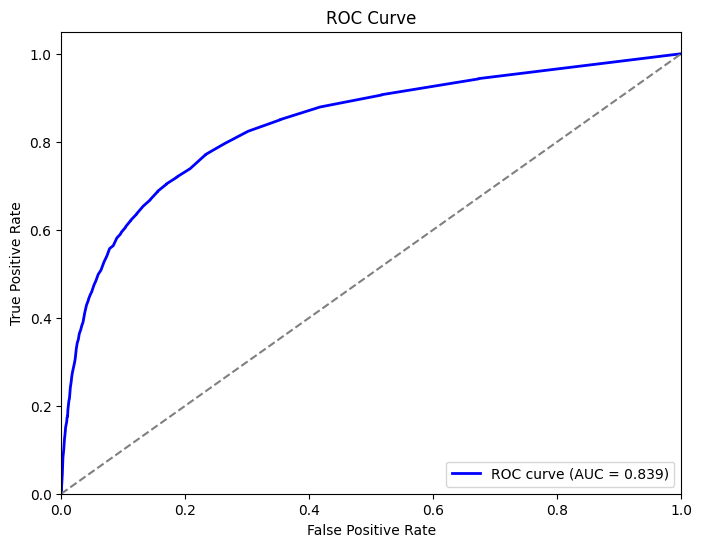

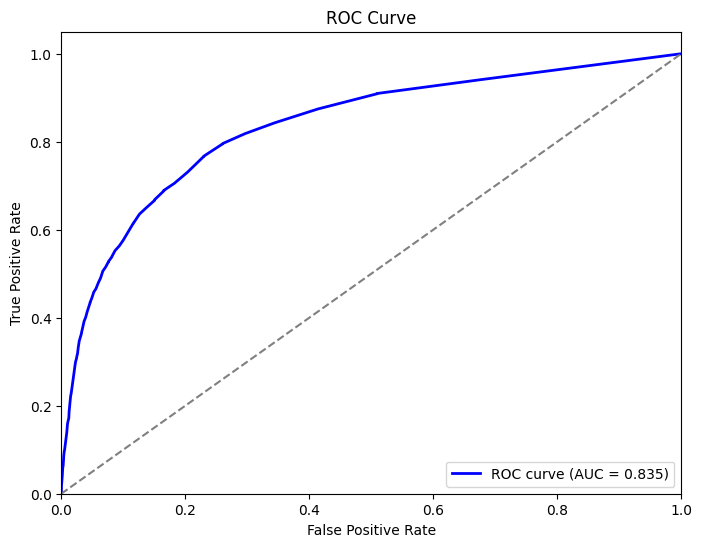

Scores on train data
Cross-validation AUC scores: [0.9999937257755559, 0.9999815167681478, 0.9999925718724484, 0.9999855069373843, 0.9999814605802575]
Mean AUC score: 0.9999869563867587
Standard Deviation AUC score: 5.277358192087085e-06
Mean precision score: 0.9988992877571927
Mean recall score: 0.995345744680851
Mean f1 score: 0.9971191570156224
Scores on test data
Cross-validation AUC scores: [0.8442149758515299, 0.8398317162995587, 0.8426548065892997, 0.8387629495283802, 0.8350441214473556]
Mean AUC score: 0.8401017139432249
Standard Deviation AUC score: 0.0031900356213079356
Mean precision score: 0.5430202934260195
Mean recall score: 0.18324468085106382
Mean f1 score: 0.27386257953158155


In [133]:
#Default classifier
rf_classifier = RandomForestClassifier(n_estimators=100, criterion="gini", max_depth=None, min_samples_split=2,
                                       max_features="sqrt", class_weight=None) # Default parameters

# Initialize Cross Validation
cv = StratifiedKFold(n_splits=5, shuffle=True)

# Initialize lists to save scores
auc_scores_train = []
precision_scores_train = []
recall_scores_train = []
f1_scores_train = []

auc_scores_test = []
precision_scores_test = []
recall_scores_test = []
f1_scores_test = []

for train_idx, test_idx in cv.split(X, y):

    # Training and test batches for the current fold
    X_train, y_train = X.loc[train_idx], y[train_idx]
    X_test, y_test = X.loc[test_idx], y[test_idx]

    # Train the model and get predictions
    rf_classifier.fit(X_train, y_train)
    y_pred_train = rf_classifier.predict(X_train)
    y_pred_test = rf_classifier.predict(X_test)
    y_pred_proba_train = rf_classifier.predict_proba(X_train)[:, 1]
    y_pred_proba_test = rf_classifier.predict_proba(X_test)[:, 1]

    # AUC, precision, recall and f1 scores for the current fold

    # On train data
    auc_train = roc_auc_score(y_train, y_pred_proba_train)
    precision_train = precision_score(y_train, y_pred_train)
    recall_train = recall_score(y_train, y_pred_train)
    f1_train = f1_score(y_train, y_pred_train)

    auc_scores_train.append(auc_train)
    precision_scores_train.append(precision_train)
    recall_scores_train.append(recall_train)
    f1_scores_train.append(f1_train)

    # On test data
    auc_test = roc_auc_score(y_test, y_pred_proba_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)

    auc_scores_test.append(auc_test)
    precision_scores_test.append(precision_test)
    recall_scores_test.append(recall_test)
    f1_scores_test.append(f1_test)

    # Plot ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba_test)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.3f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

# Print Results
print("Scores on train data")
print("Cross-validation AUC scores:", auc_scores_train)
print("Mean AUC score:", np.mean(auc_scores_train))
print("Standard Deviation AUC score:", np.std(auc_scores_train))
print("Mean precision score:", np.mean(precision_scores_train))
print("Mean recall score:", np.mean(recall_scores_train))
print("Mean f1 score:", np.mean(f1_scores_train))

print("Scores on test data")
print("Cross-validation AUC scores:", auc_scores_test)
print("Mean AUC score:", np.mean(auc_scores_test))
print("Standard Deviation AUC score:", np.std(auc_scores_test))
print("Mean precision score:", np.mean(precision_scores_test))
print("Mean recall score:", np.mean(recall_scores_test))
print("Mean f1 score:", np.mean(f1_scores_test))

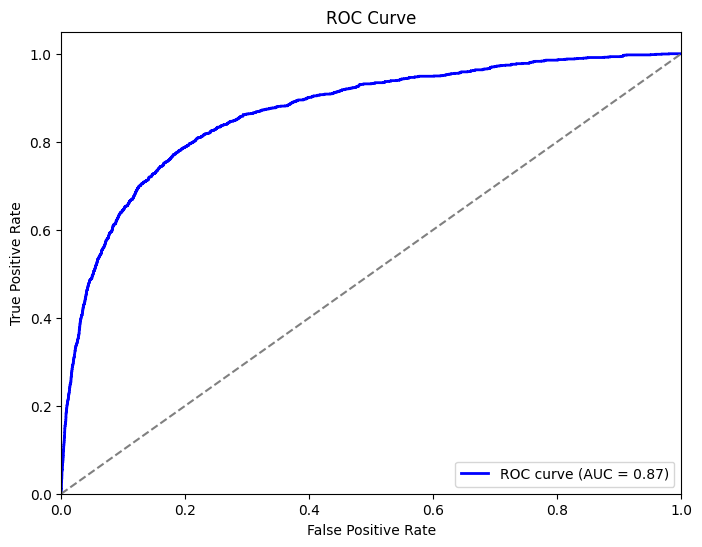

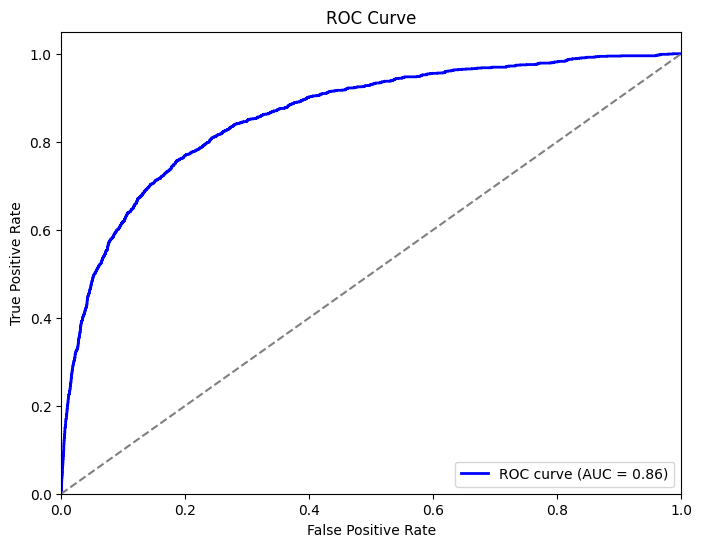

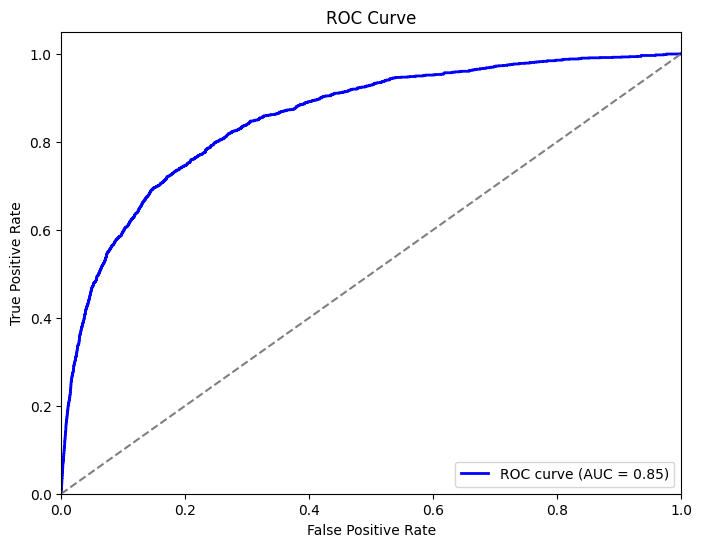

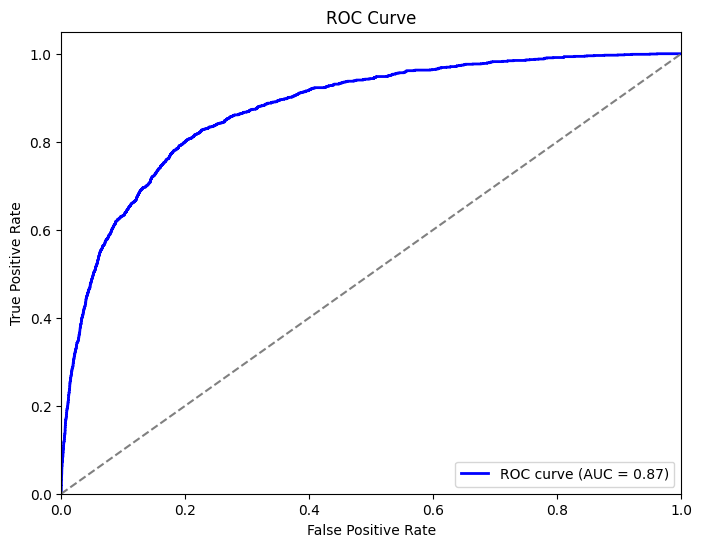

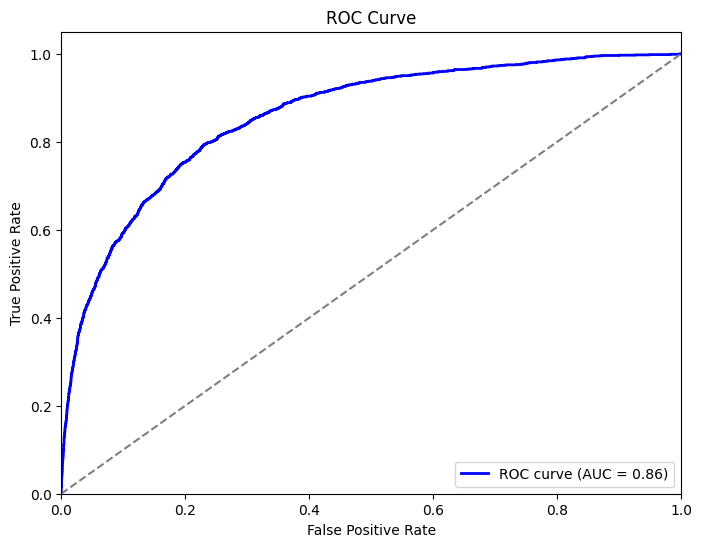

Scores on train data
Cross-validation AUC scores: [0.8960845104622871, 0.8977756336467918, 0.8992986026680679, 0.894799148497885, 0.8983372254305406]
Mean AUC score: 0.8972590241411144
Standard Deviation AUC score: 0.0016136762086237915
Mean precision score: 0.7776781797173788
Mean recall score: 0.20867686170212765
Mean f1 score: 0.329041940338192
Scores on test data
Cross-validation AUC scores: [0.8668969178019723, 0.8607376740706437, 0.8546120138638362, 0.8743576854051227, 0.8586353672100246]
Mean AUC score: 0.8630479316703198
Standard Deviation AUC score: 0.006909384173924753
Mean precision score: 0.6180298801631097
Mean recall score: 0.1595744680851064
Mean f1 score: 0.2535751129526996


In [134]:
# Hyperparameters and resampling: here we study the performance of our classifier for different
# choices of hyperparameters and resampling techniques

rf_classifier = RandomForestClassifier(n_estimators=100, criterion="log_loss", max_depth=10, min_samples_split=30,
                                       max_features="sqrt", class_weight=None)

# Define resampler
# resampler = RandomUnderSampler(sampling_strategy=1)
# resampler = NearMiss(version=3, n_neighbors=3)

# Initialize Cross Validation
cv = StratifiedKFold(n_splits=5, shuffle=True)

# Initialize lists to save scores
auc_scores_train = []
precision_scores_train = []
recall_scores_train = []
f1_scores_train = []

auc_scores_test = []
precision_scores_test = []
recall_scores_test = []
f1_scores_test = []

for train_idx, test_idx in cv.split(X, y):

    # Training and test batches for the current fold
    X_train, y_train = X.loc[train_idx], y[train_idx]
    X_test, y_test = X.loc[test_idx], y[test_idx]

    # Resampling
    # X_train, y_train = resampler.fit_resample(X_train, y_train)

    # Train the model and get predictions
    rf_classifier.fit(X_train, y_train)
    y_pred_train = rf_classifier.predict(X_train)
    y_pred_test = rf_classifier.predict(X_test)
    y_pred_proba_train = rf_classifier.predict_proba(X_train)[:, 1]
    y_pred_proba_test = rf_classifier.predict_proba(X_test)[:, 1]

    # AUC, precision, recall and f1 scores for the current fold

    # On train data
    auc_train = roc_auc_score(y_train, y_pred_proba_train)
    precision_train = precision_score(y_train, y_pred_train)
    recall_train = recall_score(y_train, y_pred_train)
    f1_train = f1_score(y_train, y_pred_train)

    auc_scores_train.append(auc_train)
    precision_scores_train.append(precision_train)
    recall_scores_train.append(recall_train)
    f1_scores_train.append(f1_train)

    # On test data
    auc_test = roc_auc_score(y_test, y_pred_proba_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)

    auc_scores_test.append(auc_test)
    precision_scores_test.append(precision_test)
    recall_scores_test.append(recall_test)
    f1_scores_test.append(f1_test)

    # Plot ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba_test)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

# Print Results
print("Scores on train data")
print("Cross-validation AUC scores:", auc_scores_train)
print("Mean AUC score:", np.mean(auc_scores_train))
print("Standard Deviation AUC score:", np.std(auc_scores_train))
print("Mean precision score:", np.mean(precision_scores_train))
print("Mean recall score:", np.mean(recall_scores_train))
print("Mean f1 score:", np.mean(f1_scores_train))

print("Scores on test data")
print("Cross-validation AUC scores:", auc_scores_test)
print("Mean AUC score:", np.mean(auc_scores_test))
print("Standard Deviation AUC score:", np.std(auc_scores_test))
print("Mean precision score:", np.mean(precision_scores_test))
print("Mean recall score:", np.mean(recall_scores_test))
print("Mean f1 score:", np.mean(f1_scores_test))

In [135]:
# Features importance: here we study the importance of each feature for our classifier

rf_classifier = RandomForestClassifier(n_estimators=100, criterion="log_loss", max_depth=10, min_samples_split=30,
                                       max_features="sqrt")

auc_scores = []
mean_features_importance = []


cv = StratifiedKFold(n_splits=5, shuffle=True)
for train_idx, test_idx in cv.split(X, y):
    # Training and test batches for the current fold
    X_train, y_train = X.loc[train_idx], y[train_idx]
    X_test, y_test = X.loc[test_idx], y[test_idx]

    # Train the model and get predicted probabilities
    rf_classifier.fit(X_train, y_train)
    y_pred_proba = rf_classifier.predict_proba(X_test)[:, 1]

    # Save feature importance
    mean_features_importance.append(rf_classifier.feature_importances_)


# Print Features importance
print("Mean Features Importance:")
for i in range(len(X.columns)):
  print(f"{X.columns[i]}: {np.mean(np.array(mean_features_importance),axis=0)[i]}")

Mean Features Importance:
RevolvingUtilizationOfUnsecuredLines: 0.28252521863547037
age: 0.050789815385558754
NumberOfTime30-59DaysPastDueNotWorse: 0.14697421921689693
DebtRatio: 0.04836714851713966
MonthlyIncome: 0.042023970296531064
NumberNonRealEstateLoansOrLines: 0.029880264110467226
NumberOfTimes90DaysLate: 0.24809682750899648
NumberRealEstateLoansOrLines: 0.02136118397671794
NumberOfTime60-89DaysPastDueNotWorse: 0.11898397595059487
NumberOfDependents: 0.01099737640162676


## XGBoost

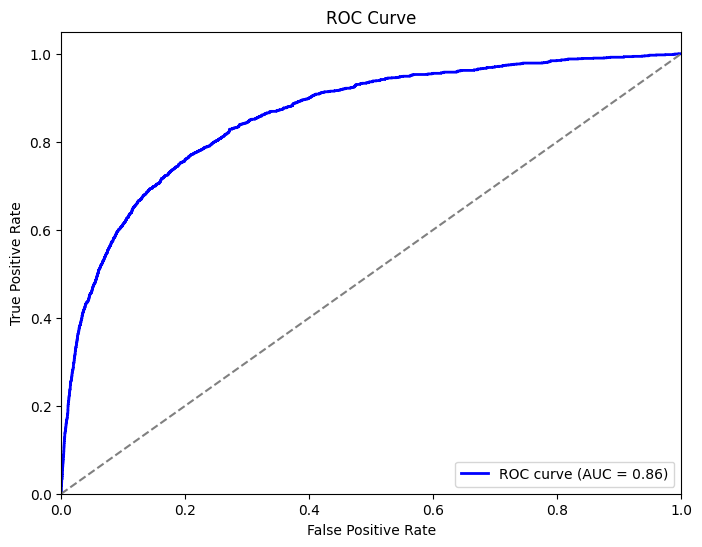

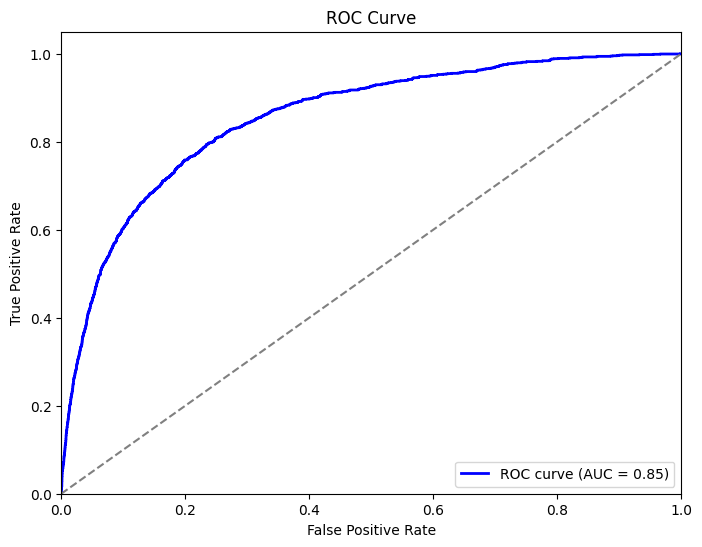

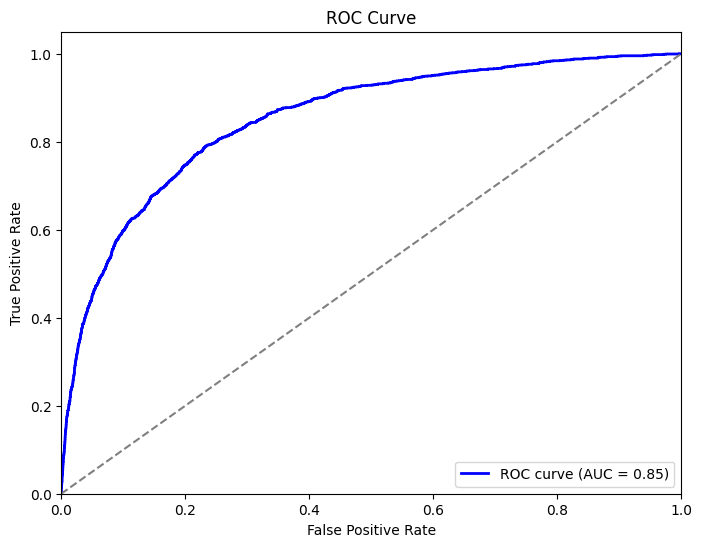

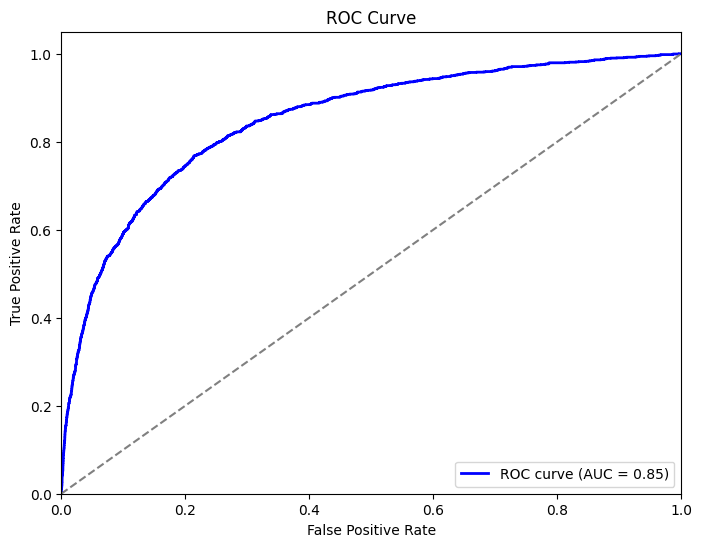

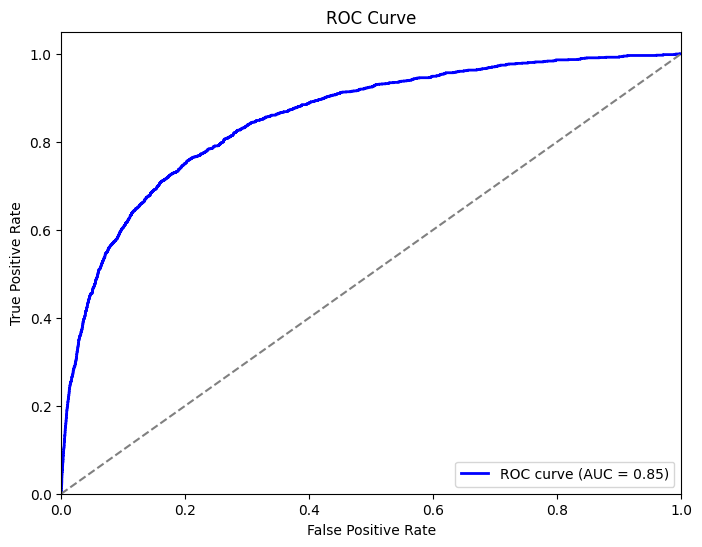

Scores on train data
Cross-validation AUC scores: [0.9222241843413218, 0.9257297370339135, 0.9248328920686457, 0.9271463628989883, 0.9229724566568277]
Mean AUC score: 0.9245811265999395
Standard Deviation AUC score: 0.0017947771363906824
Mean precision score: 0.833489637725959
Mean recall score: 0.3224734042553192
Mean f1 score: 0.46499912668489446
Scores on test data
Cross-validation AUC scores: [0.859188303471178, 0.854777318906742, 0.8524090549922376, 0.8482484663998816, 0.8537797278227339]
Mean AUC score: 0.8536805743185546
Standard Deviation AUC score: 0.0035404044504851366
Mean precision score: 0.5486302568954835
Mean recall score: 0.19946808510638298
Mean f1 score: 0.29248625778867127


In [146]:
#Default classifier

xgb_classifier = XGBClassifier(booster="gbtree", n_estimators=100, eta=0.3, max_depth=6, min_child_weight=1,
                               colsample_bynode=1, reg_lambda=1) # Default parameters

# Initialize Cross Validation
cv = StratifiedKFold(n_splits=5, shuffle=True)

# Initialize lists to save scores
auc_scores_train = []
precision_scores_train = []
recall_scores_train = []
f1_scores_train = []

auc_scores_test = []
precision_scores_test = []
recall_scores_test = []
f1_scores_test = []


for train_idx, test_idx in cv.split(X, y):

    # Training and test batches for the current fold
    X_train, y_train = X.loc[train_idx], y[train_idx]
    X_test, y_test = X.loc[test_idx], y[test_idx]

    # Train the model and get predictions
    xgb_classifier.fit(X_train, y_train)
    y_pred_train = xgb_classifier.predict(X_train)
    y_pred_test = xgb_classifier.predict(X_test)
    y_pred_proba_train = xgb_classifier.predict_proba(X_train)[:, 1]
    y_pred_proba_test = xgb_classifier.predict_proba(X_test)[:, 1]

    # AUC, precision, recall and f1 scores for the current fold

    # On train data
    auc_train = roc_auc_score(y_train, y_pred_proba_train)
    precision_train = precision_score(y_train, y_pred_train)
    recall_train = recall_score(y_train, y_pred_train)
    f1_train = f1_score(y_train, y_pred_train)

    auc_scores_train.append(auc_train)
    precision_scores_train.append(precision_train)
    recall_scores_train.append(recall_train)
    f1_scores_train.append(f1_train)

    # On test data
    auc_test = roc_auc_score(y_test, y_pred_proba_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)

    auc_scores_test.append(auc_test)
    precision_scores_test.append(precision_test)
    recall_scores_test.append(recall_test)
    f1_scores_test.append(f1_test)

    # Plot ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba_test)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

# Print Results
print("Scores on train data")
print("Cross-validation AUC scores:", auc_scores_train)
print("Mean AUC score:", np.mean(auc_scores_train))
print("Standard Deviation AUC score:", np.std(auc_scores_train))
print("Mean precision score:", np.mean(precision_scores_train))
print("Mean recall score:", np.mean(recall_scores_train))
print("Mean f1 score:", np.mean(f1_scores_train))

print("Scores on test data")
print("Cross-validation AUC scores:", auc_scores_test)
print("Mean AUC score:", np.mean(auc_scores_test))
print("Standard Deviation AUC score:", np.std(auc_scores_test))
print("Mean precision score:", np.mean(precision_scores_test))
print("Mean recall score:", np.mean(recall_scores_test))
print("Mean f1 score:", np.mean(f1_scores_test))

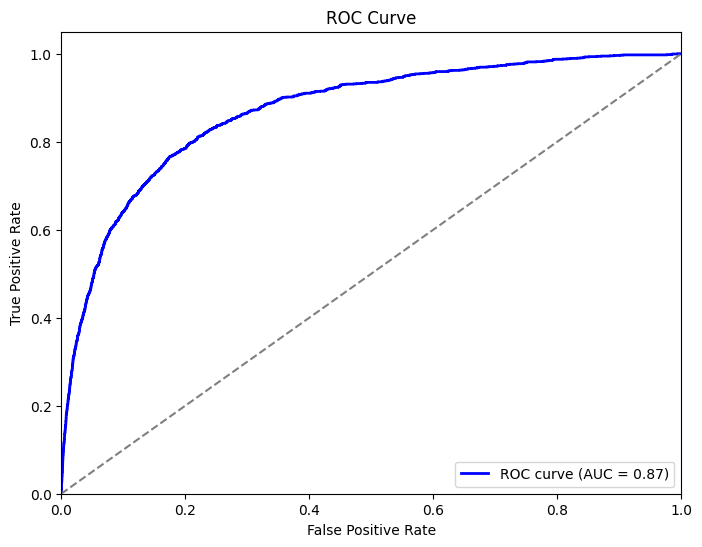

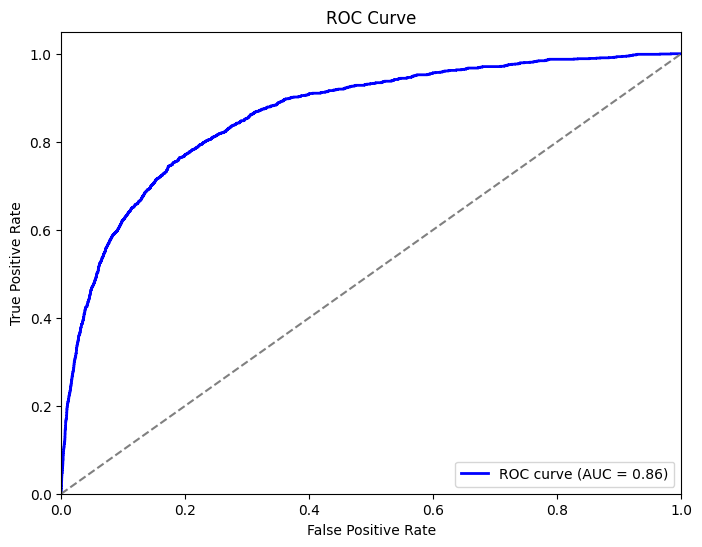

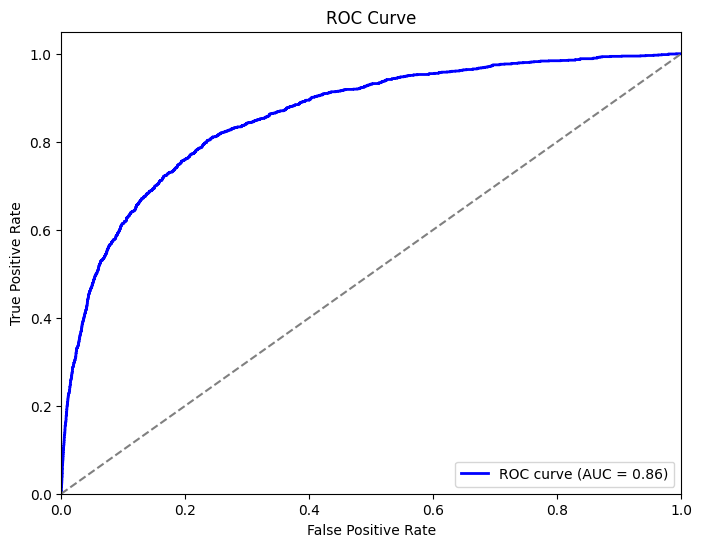

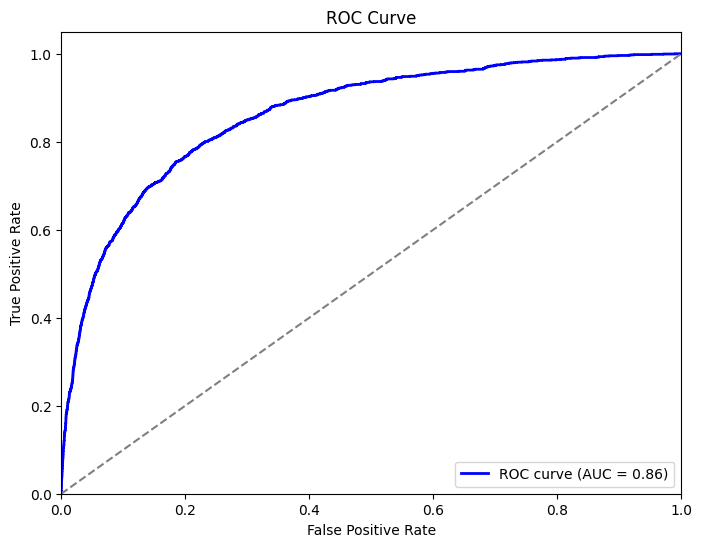

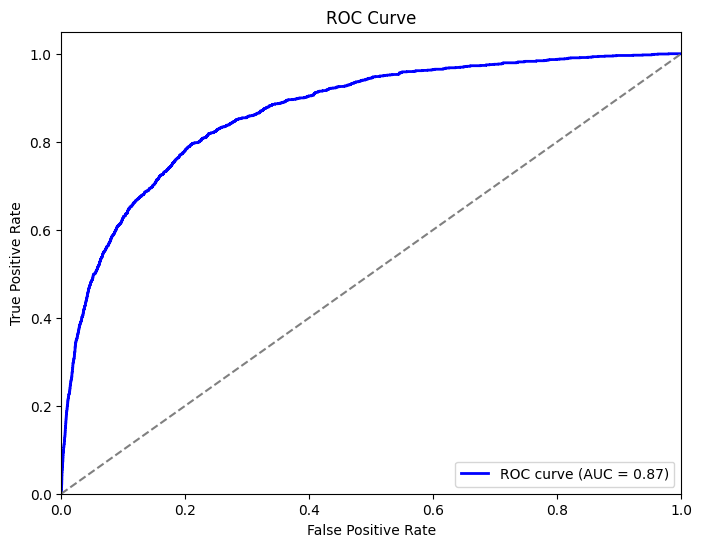

Scores on train data
Cross-validation AUC scores: [0.8850297248211454, 0.887025369567258, 0.887144612489331, 0.8868939641501661, 0.8856132388787074]
Mean AUC score: 0.8863413819813216
Standard Deviation AUC score: 0.0008566215271358912
Mean precision score: 0.7030484226589147
Mean recall score: 0.2294215425531915
Mean f1 score: 0.34592992600365347
Scores on test data
Cross-validation AUC scores: [0.86977237052245, 0.862998727214505, 0.8588905643881509, 0.8623743206659426, 0.8677640604652577]
Mean AUC score: 0.8643600086512613
Standard Deviation AUC score: 0.003913875170452867
Mean precision score: 0.5973164939599047
Mean recall score: 0.194281914893617
Mean f1 score: 0.2931004750219213


In [147]:
# Hyperparameters and resampling: here we study the performance of our classifier for different
# choices of hyperparameters and resampling techniques

xgb_classifier = XGBClassifier(booster="gbtree", n_estimators=300, eta=0.05, max_depth=6, min_child_weight=15,
                               colsample_bynode=0.3, reg_lambda=1)


# Initialize Cross Validation
cv = StratifiedKFold(n_splits=5, shuffle=True)

# Initialize lists to save scores
auc_scores_train = []
precision_scores_train = []
recall_scores_train = []
f1_scores_train = []

auc_scores_test = []
precision_scores_test = []
recall_scores_test = []
f1_scores_test = []


for train_idx, test_idx in cv.split(X, y):

    # Training and test batches for the current fold
    X_train, y_train = X.loc[train_idx], y[train_idx]
    X_test, y_test = X.loc[test_idx], y[test_idx]

    # Train the model and get predictions
    xgb_classifier.fit(X_train, y_train)
    y_pred_train = xgb_classifier.predict(X_train)
    y_pred_test = xgb_classifier.predict(X_test)
    y_pred_proba_train = xgb_classifier.predict_proba(X_train)[:, 1]
    y_pred_proba_test = xgb_classifier.predict_proba(X_test)[:, 1]

    # AUC, precision, recall and f1 scores for the current fold

    # On train data
    auc_train = roc_auc_score(y_train, y_pred_proba_train)
    precision_train = precision_score(y_train, y_pred_train)
    recall_train = recall_score(y_train, y_pred_train)
    f1_train = f1_score(y_train, y_pred_train)

    auc_scores_train.append(auc_train)
    precision_scores_train.append(precision_train)
    recall_scores_train.append(recall_train)
    f1_scores_train.append(f1_train)

    # On test data
    auc_test = roc_auc_score(y_test, y_pred_proba_test)
    precision_test = precision_score(y_test, y_pred_test)
    recall_test = recall_score(y_test, y_pred_test)
    f1_test = f1_score(y_test, y_pred_test)

    auc_scores_test.append(auc_test)
    precision_scores_test.append(precision_test)
    recall_scores_test.append(recall_test)
    f1_scores_test.append(f1_test)

    # Plot ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba_test)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

# Print Results
print("Scores on train data")
print("Cross-validation AUC scores:", auc_scores_train)
print("Mean AUC score:", np.mean(auc_scores_train))
print("Standard Deviation AUC score:", np.std(auc_scores_train))
print("Mean precision score:", np.mean(precision_scores_train))
print("Mean recall score:", np.mean(recall_scores_train))
print("Mean f1 score:", np.mean(f1_scores_train))

print("Scores on test data")
print("Cross-validation AUC scores:", auc_scores_test)
print("Mean AUC score:", np.mean(auc_scores_test))
print("Standard Deviation AUC score:", np.std(auc_scores_test))
print("Mean precision score:", np.mean(precision_scores_test))
print("Mean recall score:", np.mean(recall_scores_test))
print("Mean f1 score:", np.mean(f1_scores_test))

In [148]:
# Features importance: here we study the importance of each feature for our classifier

xgb_classifier = XGBClassifier(booster="gbtree", n_estimators=300, eta=0.05, max_depth=6, min_child_weight=15,
                               colsample_bynode=0.3, reg_lambda=1)

auc_scores = []
mean_features_importance = []

for i in range(5):
  cv = StratifiedKFold(n_splits=5, shuffle=True)
  for train_idx, test_idx in cv.split(X, y):
      features_importance_batch = []

      # Training and test batches for the current fold
      X_train, y_train = X.loc[train_idx], y[train_idx]
      X_test, y_test = X.loc[test_idx], y[test_idx]

      # Train the model and get predicted probabilities
      xgb_classifier.fit(X_train, y_train)
      y_pred_proba = xgb_classifier.predict_proba(X_test)[:, 1]

      # Save feature importance for each batch
      features_importance_batch.append(xgb_classifier.feature_importances_)

  # Save mean features importance for each cross validation
  mean_features_importance.append(np.mean(np.array(features_importance_batch),axis=0))

# Features importance
print("Mean Features Importance:")
for i in range(len(X.columns)):
  print(f"{X.columns[i]}: {np.mean(np.array(mean_features_importance),axis=0)[i]}")

Mean Features Importance:
RevolvingUtilizationOfUnsecuredLines: 0.14000216126441956
age: 0.029389310628175735
NumberOfTime30-59DaysPastDueNotWorse: 0.17495349049568176
DebtRatio: 0.019254624843597412
MonthlyIncome: 0.01754753664135933
NumberNonRealEstateLoansOrLines: 0.020335709676146507
NumberOfTimes90DaysLate: 0.3024568557739258
NumberRealEstateLoansOrLines: 0.0277742650359869
NumberOfTime60-89DaysPastDueNotWorse: 0.2554630637168884
NumberOfDependents: 0.01282298844307661


### Hyperparameter Tuning (XGBoost)

In [ ]:
!pip install optuna
import optuna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 380.1/380.1 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.8/78.8 kB 11.4 MB/s eta 0:00:00


In [ ]:
# Define objective function
def objective(trial):

    # Define hyperparameters grid
    params = {
        'objective': 'binary:logistic',
        'eval_metric': 'auc',
        "booster": "gbtree",
        'lambda': trial.suggest_uniform('lambda', 0.01,1),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.3,0.8),
        'eta': trial.suggest_loguniform('eta', 0.01,0.3),
        'n_estimators': trial.suggest_int("n_estimators",100,400),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 15),
        'random_state': 42
    }

    # Train classifier
    model = XGBClassifier(**params)
    kfold = KFold(n_splits=5, shuffle=True, random_state=23)
    cv_scores = cross_val_score(model, X, y, cv=kfold, scoring='roc_auc')

    # Compute AUC
    auc = np.mean(cv_scores)

    return auc

# Run the hyperparameter optimization
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=200)


[I 2024-05-10 06:27:48,251] A new study created in memory with name: no-name-6b33bb20-f653-40aa-b5b7-5b8de31adf56
<ipython-input-43-a1df4052d0c7>:9: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'lambda': trial.suggest_uniform('lambda', 0.01,1),
<ipython-input-43-a1df4052d0c7>:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.3,0.8),
<ipython-input-43-a1df4052d0c7>:11: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'eta': trial.suggest_loguniform('eta', 0.01,0.3),
[I 2024-05-10 06:28:3

KeyboardInterrupt: 

## Neural Network

In [136]:
def replace_values_log(original,threshold):
    if original > threshold:
        return  np.log(np.exp(threshold) + original - threshold)
    else:
        return original

In [137]:
class BinaryMLP(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_prob=0.3):
        super(BinaryMLP, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.ReLU()
        self.dropout1 = nn.Dropout(p=dropout_prob)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.relu2 = nn.ReLU()
        self.dropout2 = nn.Dropout(p=dropout_prob)
        self.fc3 = nn.Linear(hidden_size, hidden_size)
        self.relu3 = nn.ReLU()
        self.dropout3 = nn.Dropout(p=dropout_prob)
        self.fc4 = nn.Linear(hidden_size, 1)


    def forward(self, x):
        out = self.fc1(x)
        out = self.relu1(out)
        out = self.dropout1(out)
        out = self.fc2(out)
        out = self.relu2(out)
        out = self.dropout2(out)
        out = self.fc3(out)
        out = self.relu3(out)
        out = self.dropout3(out)
        out = self.fc4(out)
        out = torch.sigmoid(out)
        return out

Fold 1, Epoch [50/1000], Train Loss: 0.5310
Fold 1, Epoch [100/1000], Train Loss: 0.5008
Fold 1, Epoch [150/1000], Train Loss: 0.4557
Fold 1, Epoch [200/1000], Train Loss: 0.4154
Fold 1, Epoch [250/1000], Train Loss: 0.4005
Fold 1, Epoch [300/1000], Train Loss: 0.3957
Fold 1, Epoch [350/1000], Train Loss: 0.3879
Fold 1, Epoch [400/1000], Train Loss: 0.3862
Fold 1, Epoch [450/1000], Train Loss: 0.3827
Fold 1, Epoch [500/1000], Train Loss: 0.3812
Fold 1, Epoch [550/1000], Train Loss: 0.3800
Fold 1, Epoch [600/1000], Train Loss: 0.3812
Fold 1, Epoch [650/1000], Train Loss: 0.3766
Fold 1, Epoch [700/1000], Train Loss: 0.3749
Fold 1, Epoch [750/1000], Train Loss: 0.3762
Fold 1, Epoch [800/1000], Train Loss: 0.3755
Fold 1, Epoch [850/1000], Train Loss: 0.3735
Fold 1, Epoch [900/1000], Train Loss: 0.3744
Fold 1, Epoch [950/1000], Train Loss: 0.3736
Fold 1, Epoch [1000/1000], Train Loss: 0.3749
AUC Score Train: 0.8670
AUC Score Test: 0.8569
Test Loss: 0.2601
Precision Score: 0.3353
Recall Scor

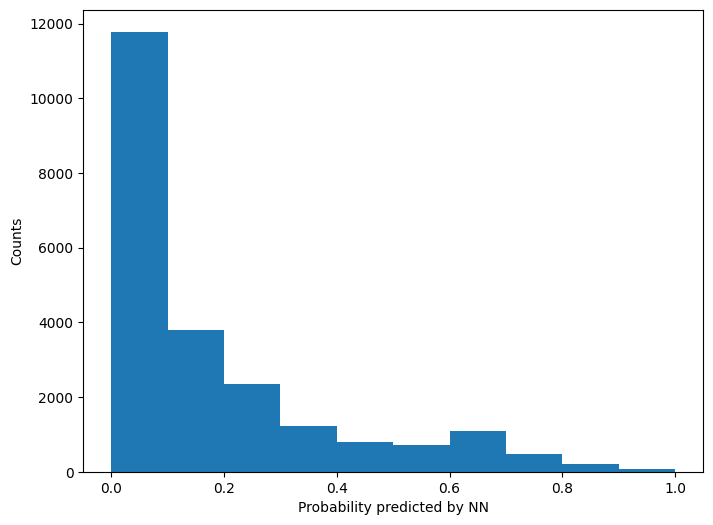

Fold 2, Epoch [50/1000], Train Loss: 0.5275
Fold 2, Epoch [100/1000], Train Loss: 0.5060
Fold 2, Epoch [150/1000], Train Loss: 0.4537
Fold 2, Epoch [200/1000], Train Loss: 0.4122
Fold 2, Epoch [250/1000], Train Loss: 0.3954
Fold 2, Epoch [300/1000], Train Loss: 0.3896
Fold 2, Epoch [350/1000], Train Loss: 0.3873
Fold 2, Epoch [400/1000], Train Loss: 0.3834
Fold 2, Epoch [450/1000], Train Loss: 0.3791
Fold 2, Epoch [500/1000], Train Loss: 0.3794
Fold 2, Epoch [550/1000], Train Loss: 0.3787
Fold 2, Epoch [600/1000], Train Loss: 0.3779
Fold 2, Epoch [650/1000], Train Loss: 0.3779
Fold 2, Epoch [700/1000], Train Loss: 0.3753
Fold 2, Epoch [750/1000], Train Loss: 0.3749
Fold 2, Epoch [800/1000], Train Loss: 0.3741
Fold 2, Epoch [850/1000], Train Loss: 0.3747
Fold 2, Epoch [900/1000], Train Loss: 0.3733
Fold 2, Epoch [950/1000], Train Loss: 0.3732
Fold 2, Epoch [1000/1000], Train Loss: 0.3712
AUC Score Train: 0.8667
AUC Score Test: 0.8689
Test Loss: 0.2584
Precision Score: 0.3681
Recall Scor

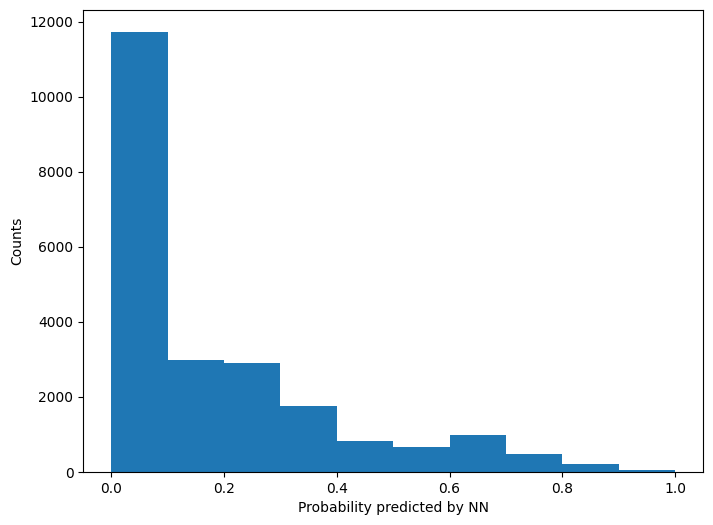

Fold 3, Epoch [50/1000], Train Loss: 0.5208
Fold 3, Epoch [100/1000], Train Loss: 0.4838
Fold 3, Epoch [150/1000], Train Loss: 0.4344
Fold 3, Epoch [200/1000], Train Loss: 0.4112
Fold 3, Epoch [250/1000], Train Loss: 0.3948
Fold 3, Epoch [300/1000], Train Loss: 0.3894
Fold 3, Epoch [350/1000], Train Loss: 0.3868
Fold 3, Epoch [400/1000], Train Loss: 0.3848
Fold 3, Epoch [450/1000], Train Loss: 0.3843
Fold 3, Epoch [500/1000], Train Loss: 0.3835
Fold 3, Epoch [550/1000], Train Loss: 0.3820
Fold 3, Epoch [600/1000], Train Loss: 0.3818
Fold 3, Epoch [650/1000], Train Loss: 0.3825
Fold 3, Epoch [700/1000], Train Loss: 0.3806
Fold 3, Epoch [750/1000], Train Loss: 0.3787
Fold 3, Epoch [800/1000], Train Loss: 0.3779
Fold 3, Epoch [850/1000], Train Loss: 0.3795
Fold 3, Epoch [900/1000], Train Loss: 0.3776
Fold 3, Epoch [950/1000], Train Loss: 0.3791
Fold 3, Epoch [1000/1000], Train Loss: 0.3770
AUC Score Train: 0.8636
AUC Score Test: 0.8690
Test Loss: 0.2526
Precision Score: 0.3692
Recall Scor

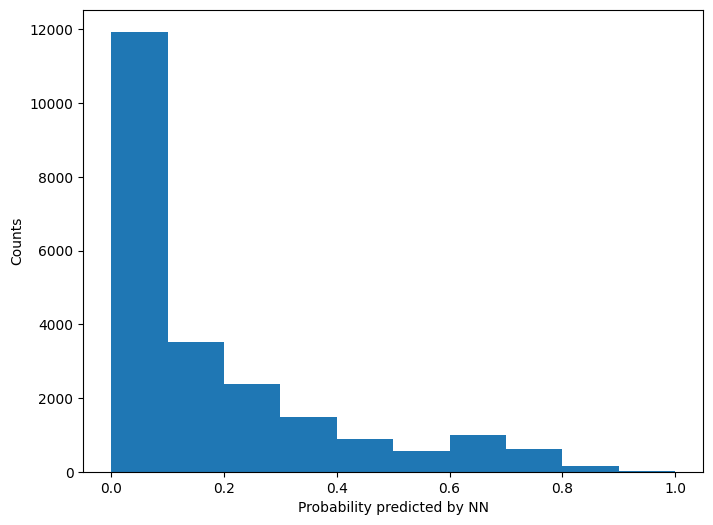

Fold 4, Epoch [50/1000], Train Loss: 0.5224
Fold 4, Epoch [100/1000], Train Loss: 0.4974
Fold 4, Epoch [150/1000], Train Loss: 0.4398
Fold 4, Epoch [200/1000], Train Loss: 0.4000
Fold 4, Epoch [250/1000], Train Loss: 0.3865
Fold 4, Epoch [300/1000], Train Loss: 0.3830
Fold 4, Epoch [350/1000], Train Loss: 0.3794
Fold 4, Epoch [400/1000], Train Loss: 0.3767
Fold 4, Epoch [450/1000], Train Loss: 0.3768
Fold 4, Epoch [500/1000], Train Loss: 0.3749
Fold 4, Epoch [550/1000], Train Loss: 0.3735
Fold 4, Epoch [600/1000], Train Loss: 0.3712
Fold 4, Epoch [650/1000], Train Loss: 0.3705
Fold 4, Epoch [700/1000], Train Loss: 0.3728
Fold 4, Epoch [750/1000], Train Loss: 0.3689
Fold 4, Epoch [800/1000], Train Loss: 0.3717
Fold 4, Epoch [850/1000], Train Loss: 0.3707
Fold 4, Epoch [900/1000], Train Loss: 0.3698
Fold 4, Epoch [950/1000], Train Loss: 0.3691
Fold 4, Epoch [1000/1000], Train Loss: 0.3690
AUC Score Train: 0.8698
AUC Score Test: 0.8628
Test Loss: 0.2511
Precision Score: 0.3662
Recall Scor

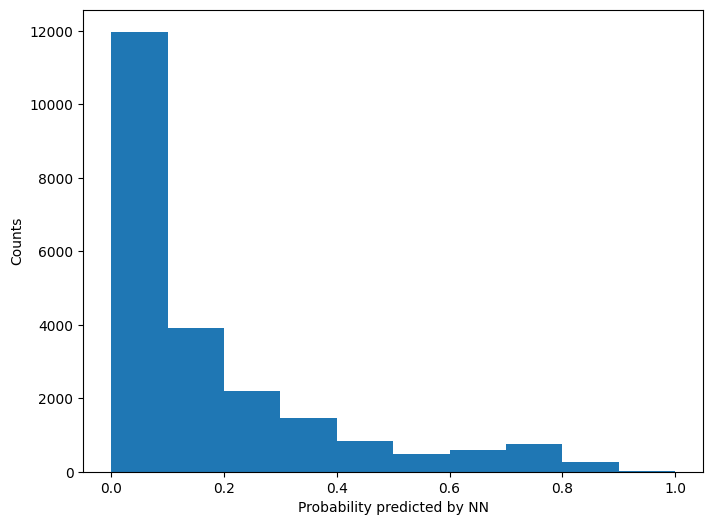

Fold 5, Epoch [50/1000], Train Loss: 0.5219
Fold 5, Epoch [100/1000], Train Loss: 0.4818
Fold 5, Epoch [150/1000], Train Loss: 0.4215
Fold 5, Epoch [200/1000], Train Loss: 0.3952
Fold 5, Epoch [250/1000], Train Loss: 0.3860
Fold 5, Epoch [300/1000], Train Loss: 0.3826
Fold 5, Epoch [350/1000], Train Loss: 0.3800
Fold 5, Epoch [400/1000], Train Loss: 0.3760
Fold 5, Epoch [450/1000], Train Loss: 0.3800
Fold 5, Epoch [500/1000], Train Loss: 0.3746
Fold 5, Epoch [550/1000], Train Loss: 0.3743
Fold 5, Epoch [600/1000], Train Loss: 0.3737
Fold 5, Epoch [650/1000], Train Loss: 0.3740
Fold 5, Epoch [700/1000], Train Loss: 0.3731
Fold 5, Epoch [750/1000], Train Loss: 0.3713
Fold 5, Epoch [800/1000], Train Loss: 0.3702
Fold 5, Epoch [850/1000], Train Loss: 0.3758
Fold 5, Epoch [900/1000], Train Loss: 0.3702
Fold 5, Epoch [950/1000], Train Loss: 0.3699
Fold 5, Epoch [1000/1000], Train Loss: 0.3695
AUC Score Train: 0.8690
AUC Score Test: 0.8539
Test Loss: 0.2566
Precision Score: 0.3443
Recall Scor

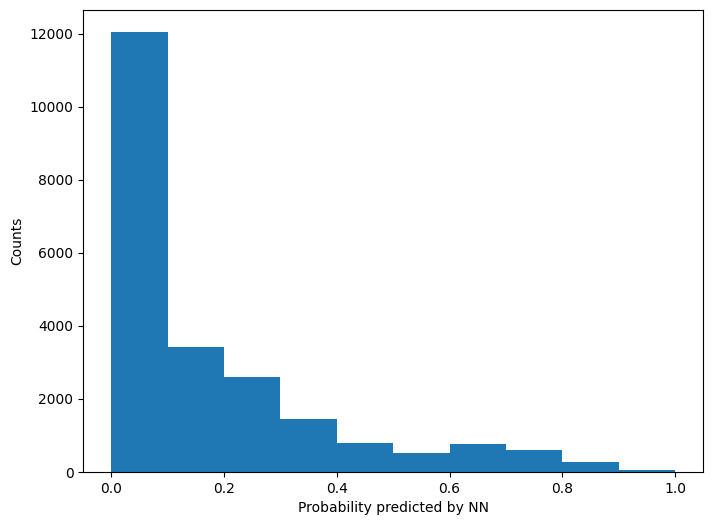

Mean AUC Score Train: 0.8672
SD AUC Score Train: 0.0022
Mean AUC Score Test: 0.8623
SD AUC Score Test: 0.0062


In [138]:
# Define the number of folds for cross-validation
num_folds = 5
skf = StratifiedKFold(n_splits=num_folds, shuffle=True)


# Initialize lists to store evaluation metrics for each fold
auc_scores_train = []
auc_scores_test = []
precision_scores = []
recall_scores = []
f1_scores = []

# Define resampler
resampler = RandomUnderSampler(sampling_strategy=0.3)

# Perform cross-validation
for fold, (train_index, test_index) in enumerate(skf.split(X, y)):
    X_train_fold, X_test_fold = X.loc[train_index], X.loc[test_index]
    y_train_fold, y_test_fold = y.loc[train_index], y.loc[test_index]

     # Resampling
    X_train_fold, y_train_fold = resampler.fit_resample(X_train_fold, y_train_fold)

    # Train and get predictions with NN
    X_train_fold['RevolvingUtilizationOfUnsecuredLines'] = X_train_fold['RevolvingUtilizationOfUnsecuredLines'].apply(replace_values_log,args=(2,))
    X_train_fold["DebtRatio"] = X_train_fold["DebtRatio"].apply(replace_values_log,args=(2,))
    X_train_fold["MonthlyIncome"] = np.log(X_train_fold["MonthlyIncome"]+1)
    X_test_fold['RevolvingUtilizationOfUnsecuredLines'] = X_test_fold['RevolvingUtilizationOfUnsecuredLines'].apply(replace_values_log,args=(2,))
    X_test_fold["DebtRatio"] = X_test_fold["DebtRatio"].apply(replace_values_log,args=(2,))
    X_test_fold["MonthlyIncome"] = np.log(X_test_fold["MonthlyIncome"]+1)

    X_train_tensor = torch.tensor(X_train_fold.values, dtype=torch.float)
    y_train_tensor = torch.tensor(y_train_fold.values, dtype=torch.float).unsqueeze(1)
    X_test_tensor = torch.tensor(X_test_fold.values, dtype=torch.float)
    y_test_tensor = torch.tensor(y_test_fold.values, dtype=torch.float).unsqueeze(1)

    input_size = X_train_fold.shape[1]
    hidden_size = 64
    dropout_prob = 0.3
    learning_rate = 0.001

    model = BinaryMLP(input_size, hidden_size,dropout_prob)
    criterion = nn.BCELoss()
    optimizer = torch.optim.Adam(
        model.parameters(),
        lr=learning_rate,
        betas=(0.9, 0.999),  # Default values for the exponential decay rates for the moment estimates
        eps=1e-8,  # Default value for term added to the denominator to improve numerical stability
        weight_decay=0,  # Default value for L2 penalty (regularization term)
        amsgrad=False  # Default value for whether to use the AMSGrad variant of this algorithm
    )

    for epoch in range(1000):
        model.train()
        optimizer.zero_grad()
        outputs = model(X_train_tensor)
        loss = criterion(outputs, y_train_tensor)
        loss.backward()
        optimizer.step()
        if (epoch+1) % 50 == 0:
            print(f'Fold {fold+1}, Epoch [{epoch+1}/{1000}], Train Loss: {loss:.4f}')


    model.eval()
    with torch.no_grad():
        outputs_train = model(X_train_tensor)
        outputs_test = model(X_test_tensor)
        predicted_test = torch.round(outputs_test).numpy()
        y_train_np = y_train_tensor.numpy().astype(float)
        y_test_np = y_test_tensor.numpy().astype(float)

        # Calculate AUC, precision, recall and f1 scores
        loss = criterion(outputs_test, y_test_tensor)
        auc_score_train = roc_auc_score(y_train_np, outputs_train.numpy())
        auc_score_test = roc_auc_score(y_test_np, outputs_test.numpy())
        precision = precision_score(y_test_np, predicted_test)
        recall = recall_score(y_test_np, predicted_test)
        f1 = f1_score(y_test_np, predicted_test)

        print(f"AUC Score Train: {auc_score_train:.4f}")
        print(f"AUC Score Test: {auc_score_test:.4f}")
        print(f"Test Loss: {loss:.4f}")
        print(f"Precision Score: {precision:.4f}")
        print(f"Recall Score: {recall:.4f}")
        print(f"F1 Score: {f1:.4f}")



    # Plot predictions
    plt.figure(figsize=(8, 6))
    plt.hist(outputs_test.numpy(), bins=list(np.linspace(0,1,11)), density=False)
    plt.xlabel('Probability predicted by NN')
    plt.ylabel('Counts')
    plt.show()

    auc_scores_train.append(auc_score_train)
    auc_scores_test.append(auc_score_test)
    precision_scores.append(precision)
    recall_scores.append(recall)
    f1_scores.append(f1)


# Print Results
print(f"Mean AUC Score Train: {np.mean(auc_scores_train):.4f}")
print(f"SD AUC Score Train: {np.std(auc_scores_train):.4f}")
print(f"Mean AUC Score Test: {np.mean(auc_scores_test):.4f}")
print(f"SD AUC Score Test: {np.std(auc_scores_test):.4f}")


# ***Discussion***

## Models' Predictions Comparison

In [139]:
def replace_values_log(original,threshold):
    if original > threshold:
        return  np.log(np.exp(threshold) + original - threshold)
    else:
        return original

In [140]:
class BinaryMLP(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_prob=0.3):
        super(BinaryMLP, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.ReLU()
        self.dropout1 = nn.Dropout(p=dropout_prob)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.relu2 = nn.ReLU()
        self.dropout2 = nn.Dropout(p=dropout_prob)
        self.fc3 = nn.Linear(hidden_size, hidden_size)
        self.relu3 = nn.ReLU()
        self.dropout3 = nn.Dropout(p=dropout_prob)
        self.fc4 = nn.Linear(hidden_size, 1)


    def forward(self, x):
        out = self.fc1(x)
        out = self.relu1(out)
        out = self.dropout1(out)
        out = self.fc2(out)
        out = self.relu2(out)
        out = self.dropout2(out)
        out = self.fc3(out)
        out = self.relu3(out)
        out = self.dropout3(out)
        out = self.fc4(out)
        out = torch.sigmoid(out)
        return out

Fold 1, Epoch [50/1000], Loss: 0.5151
Fold 1, Epoch [100/1000], Loss: 0.4651
Fold 1, Epoch [150/1000], Loss: 0.4146
Fold 1, Epoch [200/1000], Loss: 0.3959
Fold 1, Epoch [250/1000], Loss: 0.3844
Fold 1, Epoch [300/1000], Loss: 0.3803
Fold 1, Epoch [350/1000], Loss: 0.3780
Fold 1, Epoch [400/1000], Loss: 0.3800
Fold 1, Epoch [450/1000], Loss: 0.3754
Fold 1, Epoch [500/1000], Loss: 0.3760
Fold 1, Epoch [550/1000], Loss: 0.3727
Fold 1, Epoch [600/1000], Loss: 0.3726
Fold 1, Epoch [650/1000], Loss: 0.3767
Fold 1, Epoch [700/1000], Loss: 0.3721
Fold 1, Epoch [750/1000], Loss: 0.3702
Fold 1, Epoch [800/1000], Loss: 0.3696
Fold 1, Epoch [850/1000], Loss: 0.3687
Fold 1, Epoch [900/1000], Loss: 0.3704
Fold 1, Epoch [950/1000], Loss: 0.3677
Fold 1, Epoch [1000/1000], Loss: 0.3669
AUC Score RF: 0.8623
AUC Score XGB: 0.8617
AUC Score NN: 0.8632
Test Loss NN: 0.2497


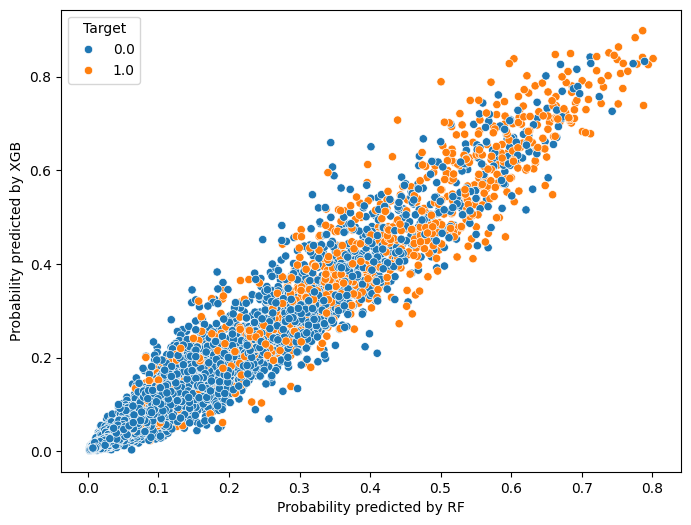

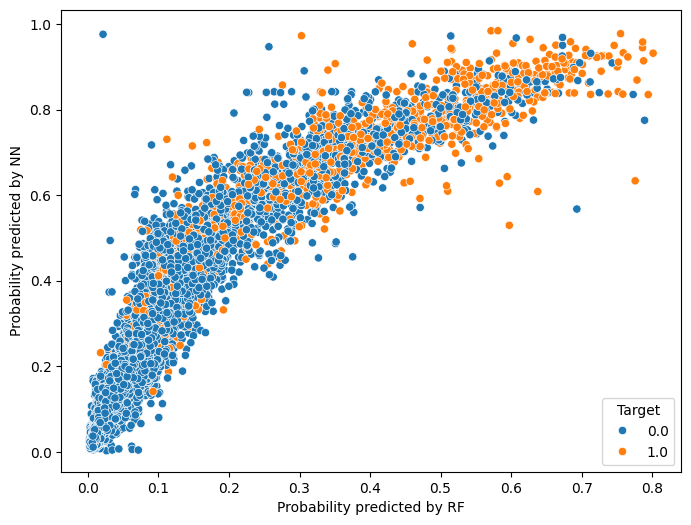

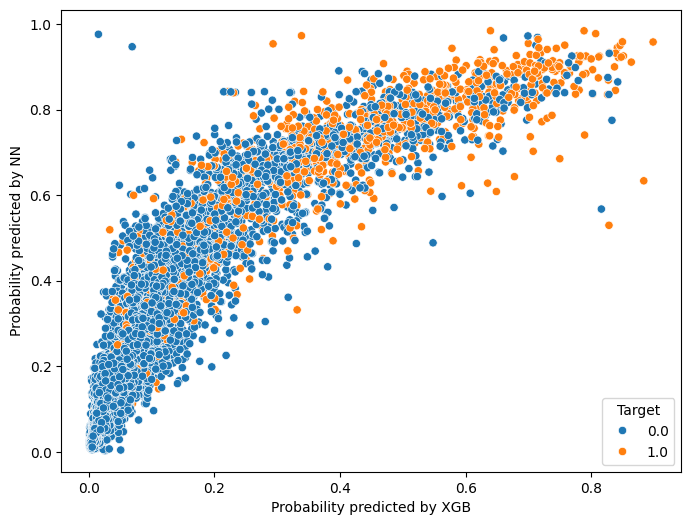

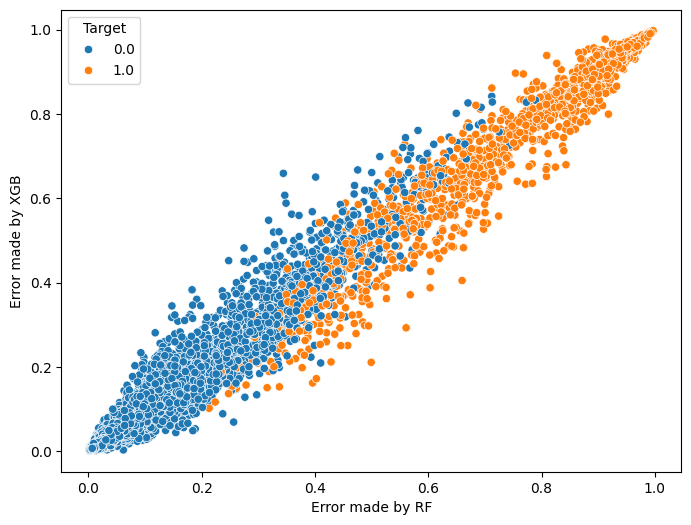

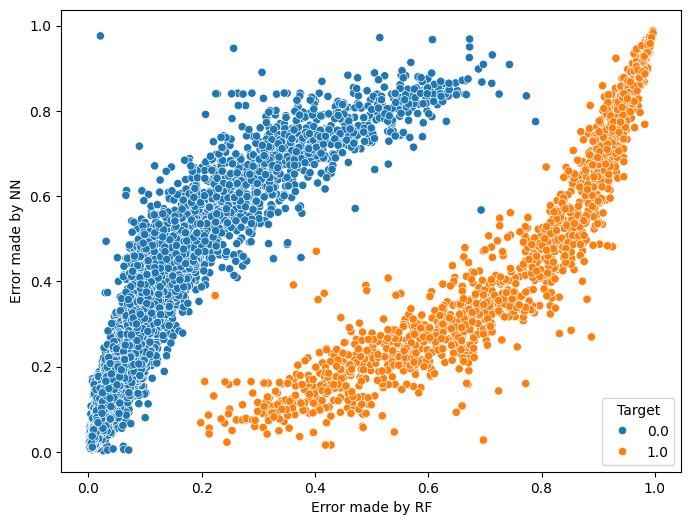

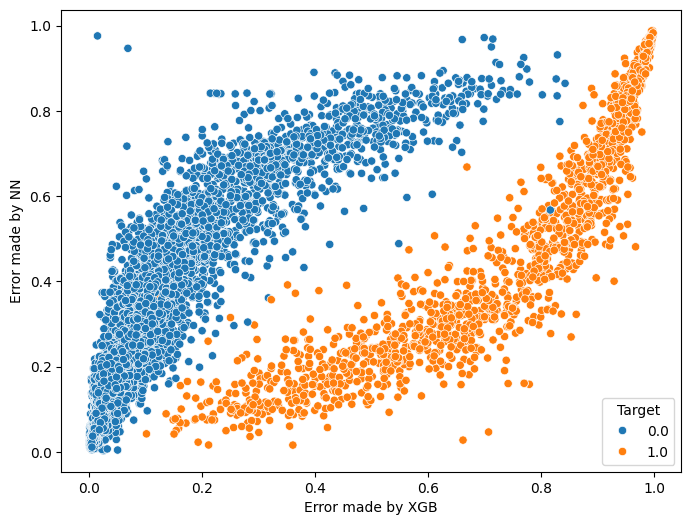

Fold 2, Epoch [50/1000], Loss: 0.5210
Fold 2, Epoch [100/1000], Loss: 0.4852
Fold 2, Epoch [150/1000], Loss: 0.4377
Fold 2, Epoch [200/1000], Loss: 0.4040
Fold 2, Epoch [250/1000], Loss: 0.3943
Fold 2, Epoch [300/1000], Loss: 0.3865
Fold 2, Epoch [350/1000], Loss: 0.3810
Fold 2, Epoch [400/1000], Loss: 0.3824
Fold 2, Epoch [450/1000], Loss: 0.3783
Fold 2, Epoch [500/1000], Loss: 0.3766
Fold 2, Epoch [550/1000], Loss: 0.3767
Fold 2, Epoch [600/1000], Loss: 0.3734
Fold 2, Epoch [650/1000], Loss: 0.3745
Fold 2, Epoch [700/1000], Loss: 0.3734
Fold 2, Epoch [750/1000], Loss: 0.3723
Fold 2, Epoch [800/1000], Loss: 0.3731
Fold 2, Epoch [850/1000], Loss: 0.3715
Fold 2, Epoch [900/1000], Loss: 0.3694
Fold 2, Epoch [950/1000], Loss: 0.3707
Fold 2, Epoch [1000/1000], Loss: 0.3689
AUC Score RF: 0.8634
AUC Score XGB: 0.8618
AUC Score NN: 0.8612
Test Loss NN: 0.2615


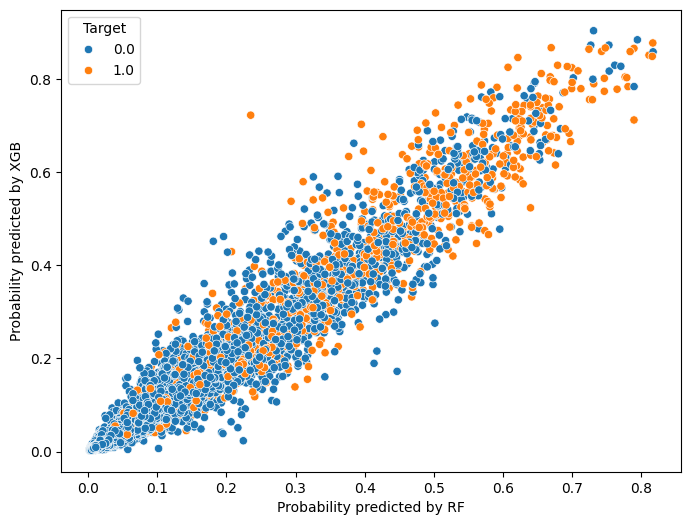

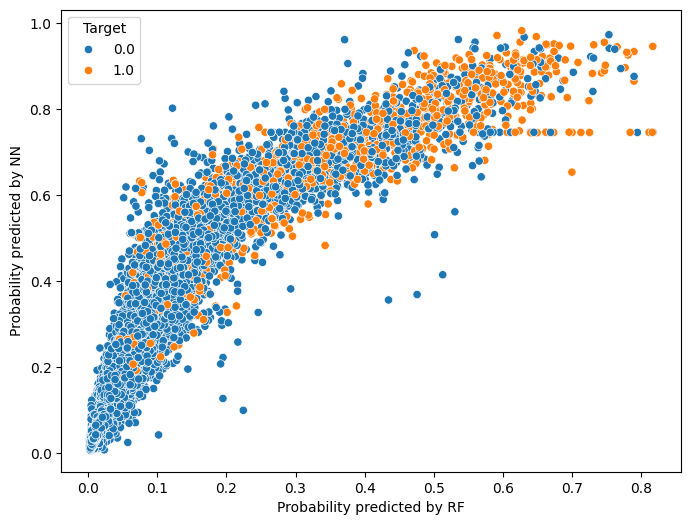

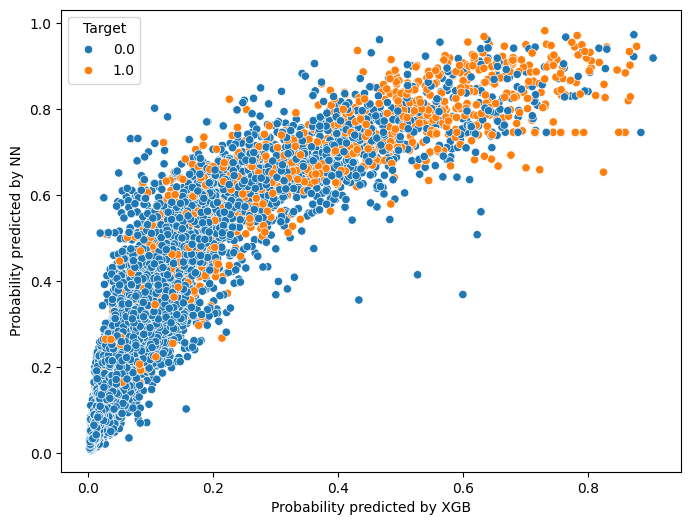

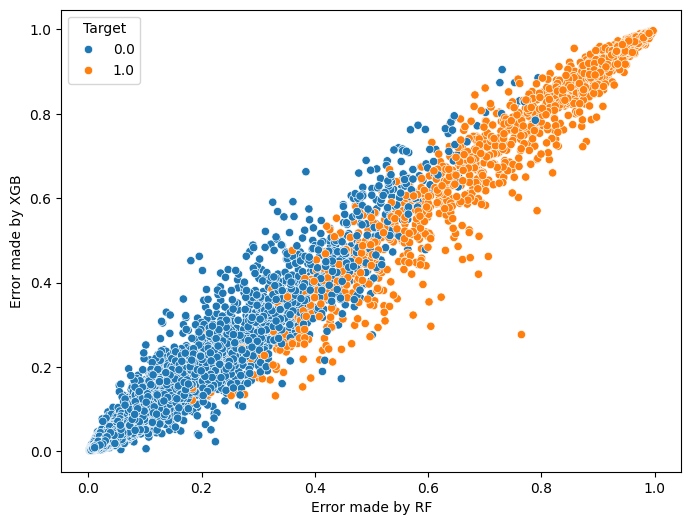

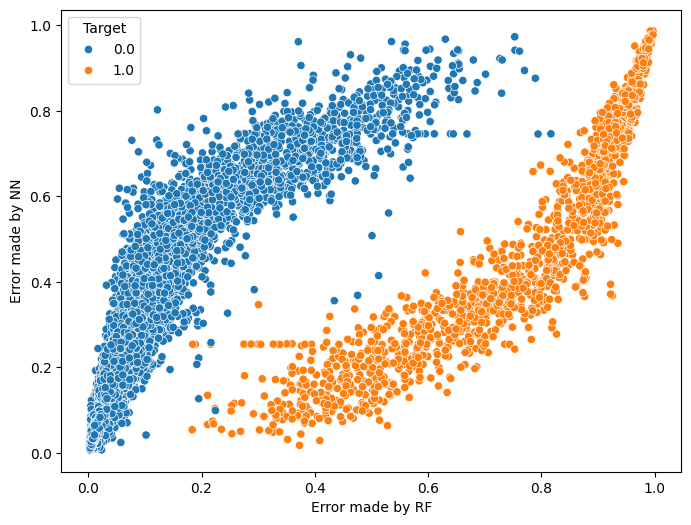

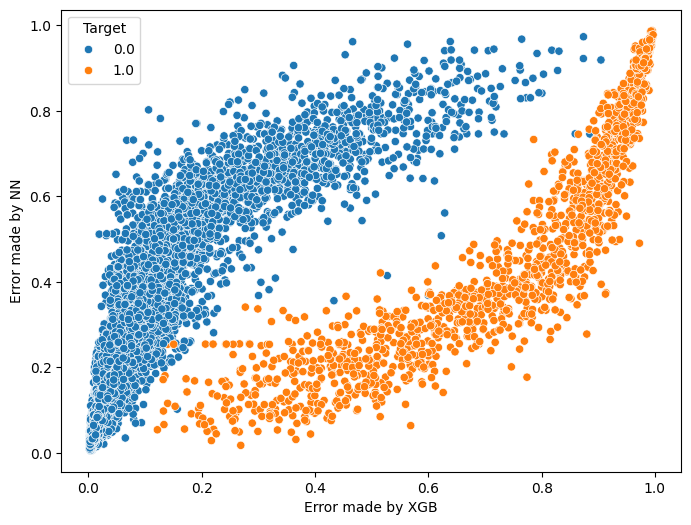

Fold 3, Epoch [50/1000], Loss: 0.5222
Fold 3, Epoch [100/1000], Loss: 0.4873
Fold 3, Epoch [150/1000], Loss: 0.4277
Fold 3, Epoch [200/1000], Loss: 0.4023
Fold 3, Epoch [250/1000], Loss: 0.3897
Fold 3, Epoch [300/1000], Loss: 0.3824
Fold 3, Epoch [350/1000], Loss: 0.3816
Fold 3, Epoch [400/1000], Loss: 0.3768
Fold 3, Epoch [450/1000], Loss: 0.3764
Fold 3, Epoch [500/1000], Loss: 0.3762
Fold 3, Epoch [550/1000], Loss: 0.3760
Fold 3, Epoch [600/1000], Loss: 0.3718
Fold 3, Epoch [650/1000], Loss: 0.3734
Fold 3, Epoch [700/1000], Loss: 0.3739
Fold 3, Epoch [750/1000], Loss: 0.3736
Fold 3, Epoch [800/1000], Loss: 0.3720
Fold 3, Epoch [850/1000], Loss: 0.3718
Fold 3, Epoch [900/1000], Loss: 0.3704
Fold 3, Epoch [950/1000], Loss: 0.3711
Fold 3, Epoch [1000/1000], Loss: 0.3703
AUC Score RF: 0.8626
AUC Score XGB: 0.8639
AUC Score NN: 0.8611
Test Loss NN: 0.2513


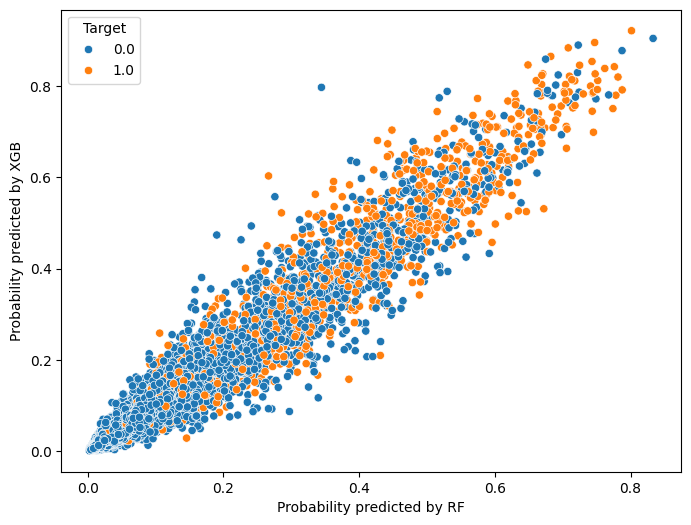

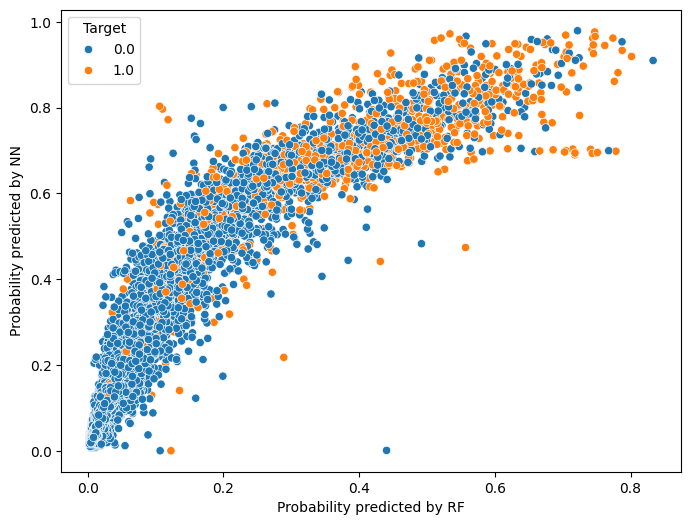

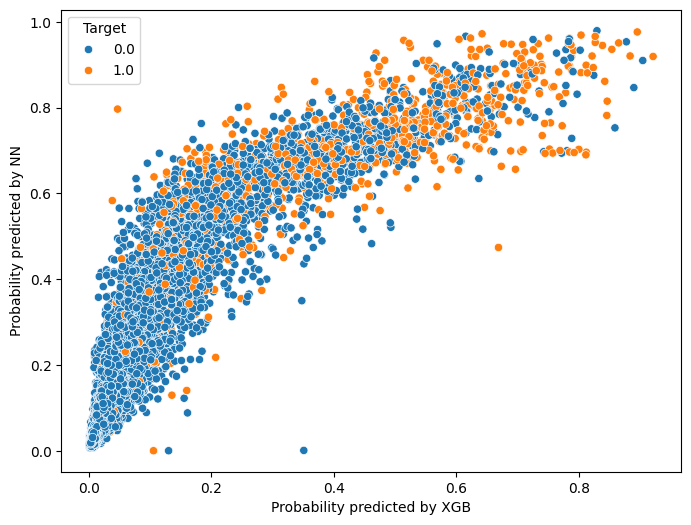

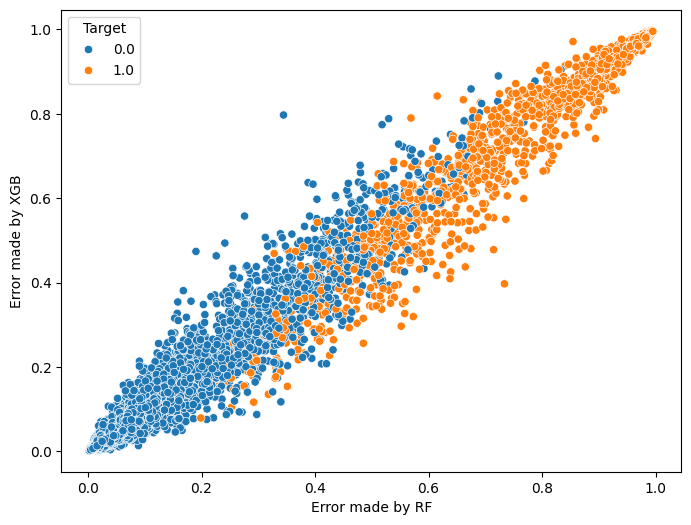

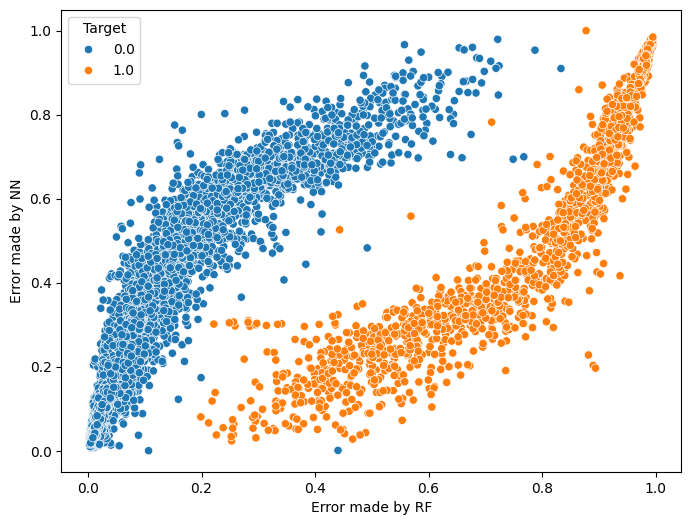

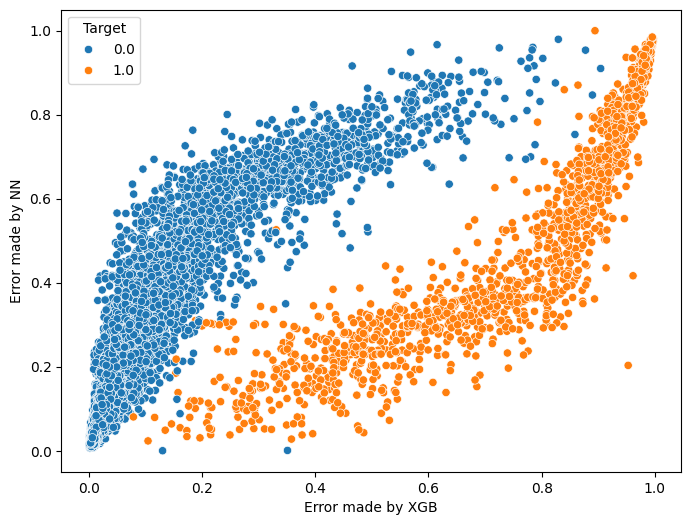

Fold 4, Epoch [50/1000], Loss: 0.5234
Fold 4, Epoch [100/1000], Loss: 0.4910
Fold 4, Epoch [150/1000], Loss: 0.4247
Fold 4, Epoch [200/1000], Loss: 0.4011
Fold 4, Epoch [250/1000], Loss: 0.3876
Fold 4, Epoch [300/1000], Loss: 0.3842
Fold 4, Epoch [350/1000], Loss: 0.3826
Fold 4, Epoch [400/1000], Loss: 0.3793
Fold 4, Epoch [450/1000], Loss: 0.3792
Fold 4, Epoch [500/1000], Loss: 0.3796
Fold 4, Epoch [550/1000], Loss: 0.3766
Fold 4, Epoch [600/1000], Loss: 0.3767
Fold 4, Epoch [650/1000], Loss: 0.3739
Fold 4, Epoch [700/1000], Loss: 0.3748
Fold 4, Epoch [750/1000], Loss: 0.3728
Fold 4, Epoch [800/1000], Loss: 0.3720
Fold 4, Epoch [850/1000], Loss: 0.3713
Fold 4, Epoch [900/1000], Loss: 0.3723
Fold 4, Epoch [950/1000], Loss: 0.3724
Fold 4, Epoch [1000/1000], Loss: 0.3724
AUC Score RF: 0.8660
AUC Score XGB: 0.8662
AUC Score NN: 0.8629
Test Loss NN: 0.2526


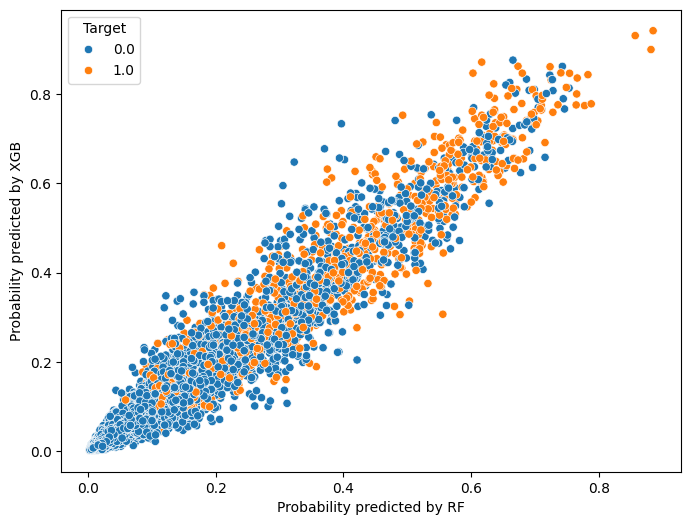

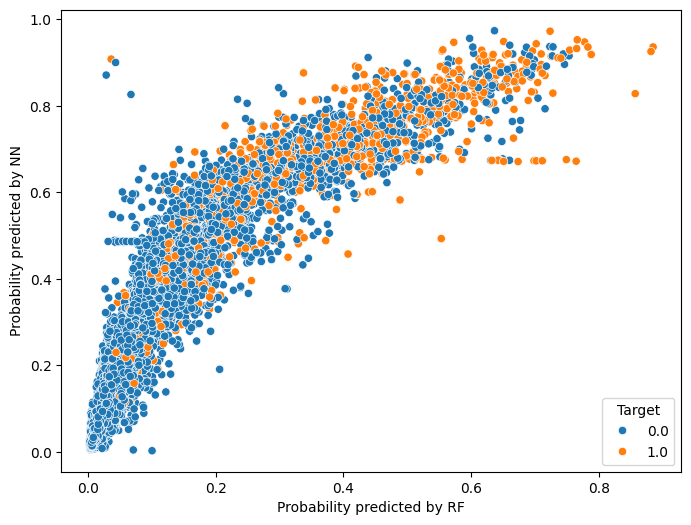

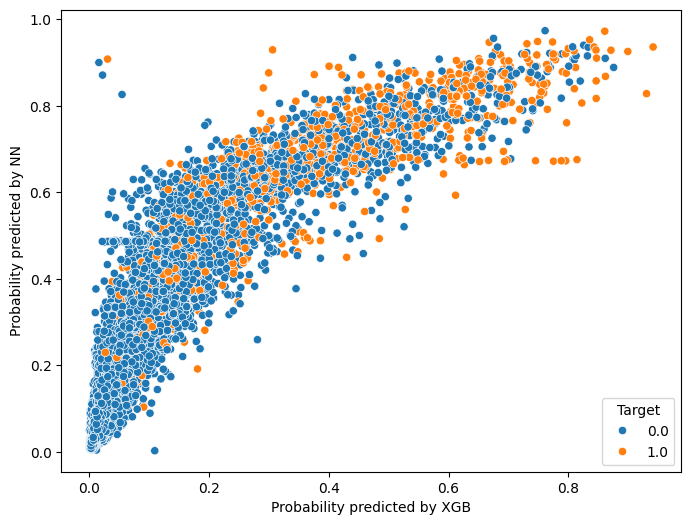

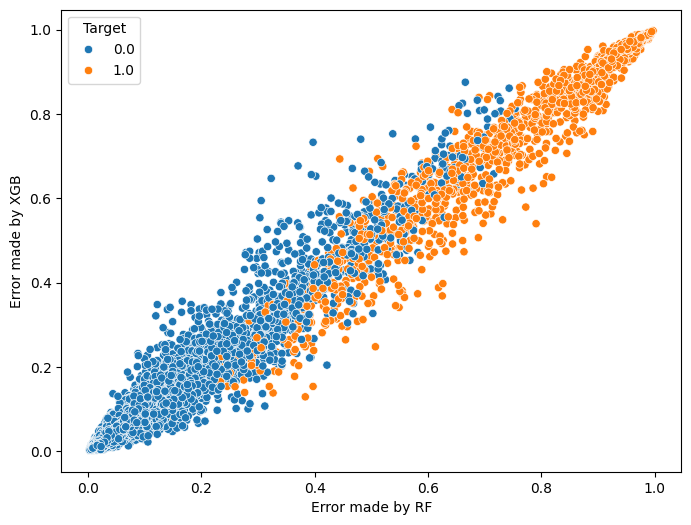

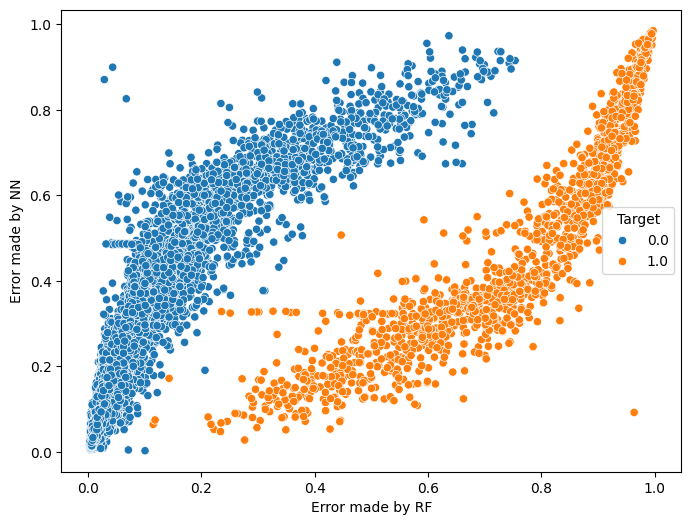

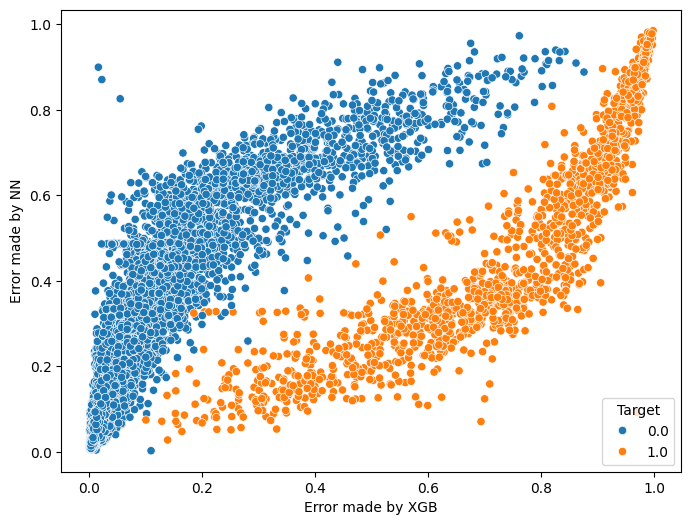

Fold 5, Epoch [50/1000], Loss: 0.5255
Fold 5, Epoch [100/1000], Loss: 0.4934
Fold 5, Epoch [150/1000], Loss: 0.4378
Fold 5, Epoch [200/1000], Loss: 0.4067
Fold 5, Epoch [250/1000], Loss: 0.3954
Fold 5, Epoch [300/1000], Loss: 0.3904
Fold 5, Epoch [350/1000], Loss: 0.3849
Fold 5, Epoch [400/1000], Loss: 0.3825
Fold 5, Epoch [450/1000], Loss: 0.3808
Fold 5, Epoch [500/1000], Loss: 0.3803
Fold 5, Epoch [550/1000], Loss: 0.3807
Fold 5, Epoch [600/1000], Loss: 0.3786
Fold 5, Epoch [650/1000], Loss: 0.3752
Fold 5, Epoch [700/1000], Loss: 0.3761
Fold 5, Epoch [750/1000], Loss: 0.3759
Fold 5, Epoch [800/1000], Loss: 0.3734
Fold 5, Epoch [850/1000], Loss: 0.3734
Fold 5, Epoch [900/1000], Loss: 0.3743
Fold 5, Epoch [950/1000], Loss: 0.3751
Fold 5, Epoch [1000/1000], Loss: 0.3742
AUC Score RF: 0.8619
AUC Score XGB: 0.8636
AUC Score NN: 0.8605
Test Loss NN: 0.2548


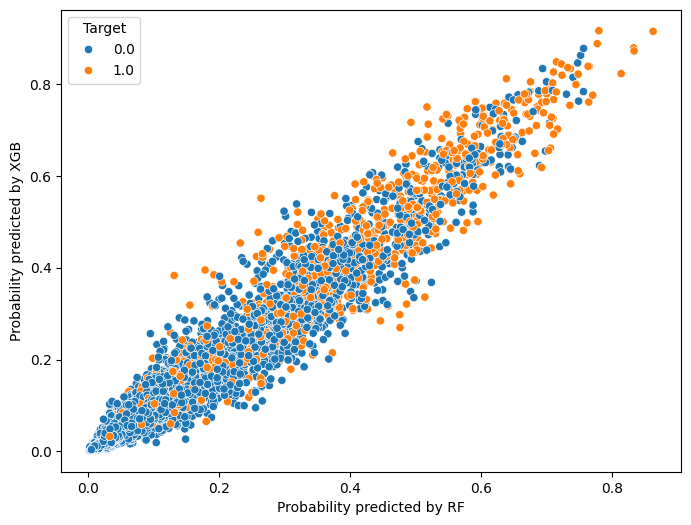

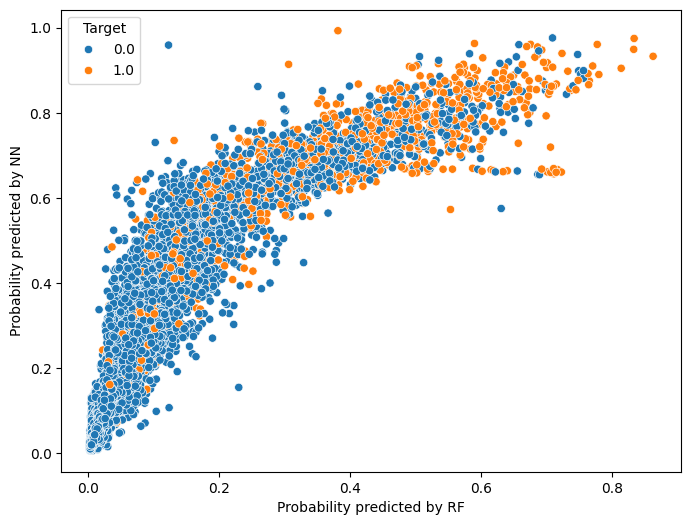

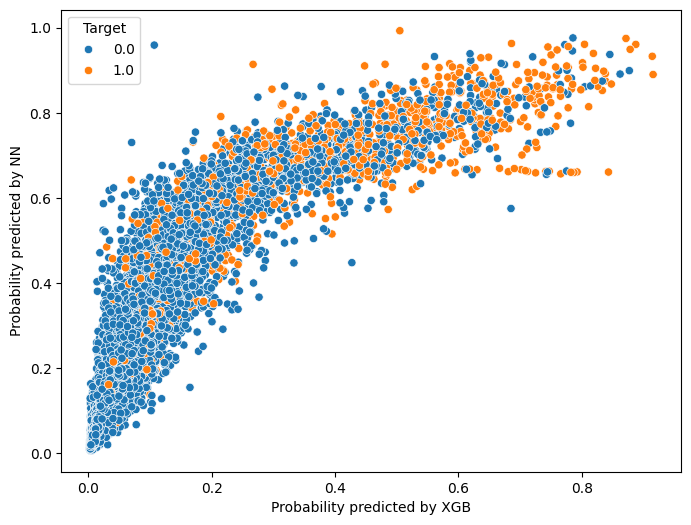

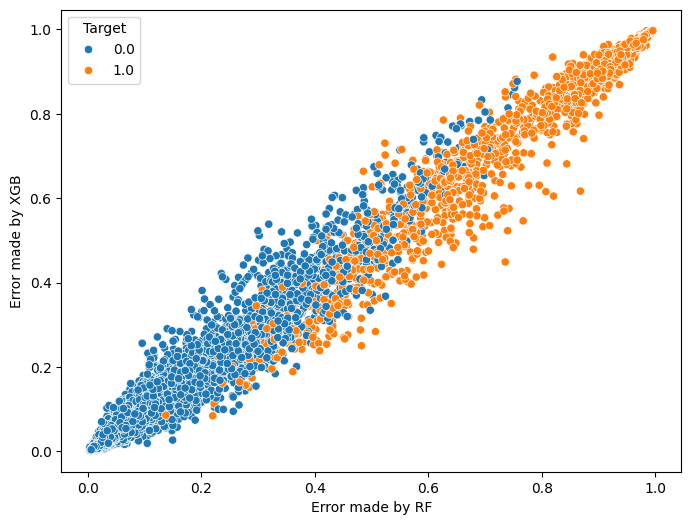

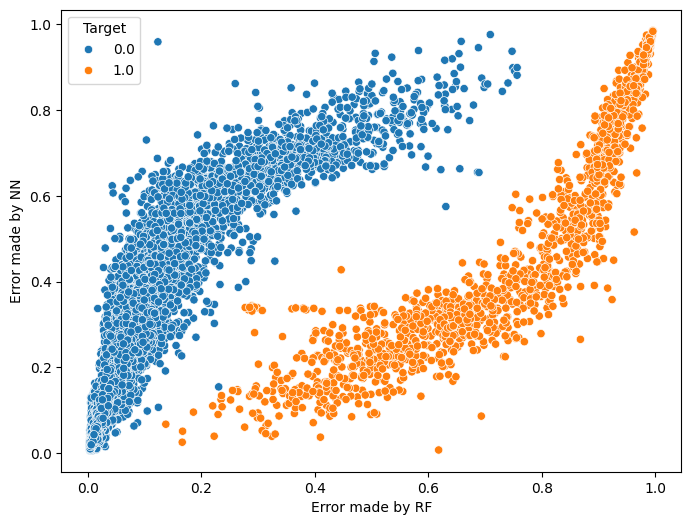

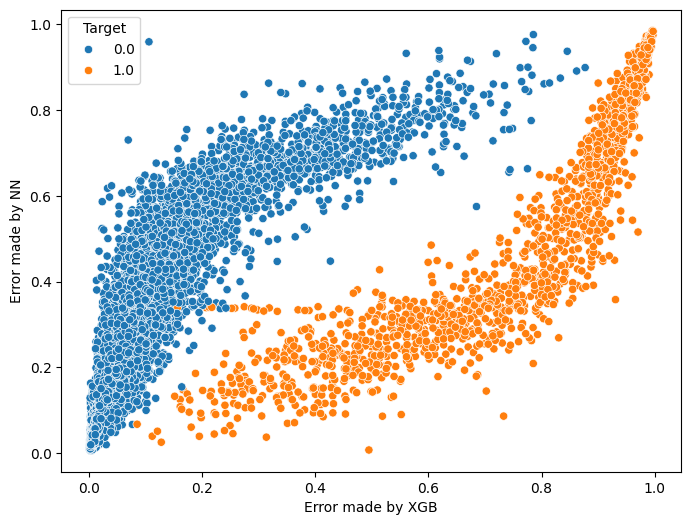

Mean AUC score RF: 0.8632531814262251
Standard Deviation AUC score RF: 0.0014845238340388401
Mean AUC score XGB: 0.863443539758461
Standard Deviation AUC score XGB: 0.0016568370514023132
Mean AUC score NN: 0.8617772126089894
Standard Deviation AUC score NN: 0.001081227540065779


In [141]:
# Analysis of the difference in predictions: here we analyze how the two classifiers differ in their predictions
# to understand if, by combining them, we can improve the overall performance

# We use the two classifiers with their best settings
rf_classifier = RandomForestClassifier(n_estimators=100, criterion="log_loss", max_depth=10, min_samples_split=15,
                                       max_features="sqrt", class_weight=None)

xgb_classifier = XGBClassifier(booster="gbtree", n_estimators=300, eta=0.05, max_depth=6, min_child_weight=15,
                               colsample_bynode=0.5, reg_lambda=1)

resampler = RandomUnderSampler(sampling_strategy=0.3)

cv = StratifiedKFold(n_splits=5, shuffle=True)
auc_scores_rf = []
auc_scores_xgb = []
auc_scores_nn = []
tests = pd.DataFrame(columns = ['RevolvingUtilizationOfUnsecuredLines', 'age',
           'NumberOfTime30-59DaysPastDueNotWorse', 'DebtRatio', 'MonthlyIncome',
           'NumberNonRealEstateLoansOrLines', 'NumberOfTimes90DaysLate',
           'NumberRealEstateLoansOrLines', 'NumberOfTime60-89DaysPastDueNotWorse',
           'NumberOfDependents', "RF", "XGB", "NN", "Best","True"])


for fold, (train_idx, test_idx) in enumerate(cv.split(X, y)):
    X_train_fold, y_train_fold = X.loc[train_idx], y[train_idx]
    X_test_fold, y_test_fold = X.loc[test_idx], y[test_idx]

    # Save a copy of test
    X_test_copy = X_test_fold.copy()

    # Train and get predictions with Random Forest
    rf_classifier.fit(X_train_fold, y_train_fold)
    y_pred_proba_rf = rf_classifier.predict_proba(X_test_fold)[:, 1]

    # Train and get predictions with XGBoost
    xgb_classifier.fit(X_train_fold, y_train_fold)
    y_pred_proba_xgb = xgb_classifier.predict_proba(X_test_fold)[:, 1]

    # Train and get predictions with NN

    # Resampling
    X_train_fold, y_train_fold = resampler.fit_resample(X_train_fold, y_train_fold)

    # Train and get predictions with NN
    X_train_fold['RevolvingUtilizationOfUnsecuredLines'] = X_train_fold['RevolvingUtilizationOfUnsecuredLines'].apply(replace_values_log,args=(2,))
    X_train_fold["DebtRatio"] = X_train_fold["DebtRatio"].apply(replace_values_log,args=(2,))
    X_train_fold["MonthlyIncome"] = np.log(X_train_fold["MonthlyIncome"]+1)
    X_test_fold['RevolvingUtilizationOfUnsecuredLines'] = X_test_fold['RevolvingUtilizationOfUnsecuredLines'].apply(replace_values_log,args=(2,))
    X_test_fold["DebtRatio"] = X_test_fold["DebtRatio"].apply(replace_values_log,args=(2,))
    X_test_fold["MonthlyIncome"] = np.log(X_test_fold["MonthlyIncome"]+1)

    X_train_tensor = torch.tensor(X_train_fold.values, dtype=torch.float)
    y_train_tensor = torch.tensor(y_train_fold.values, dtype=torch.float).unsqueeze(1)
    X_test_tensor = torch.tensor(X_test_fold.values, dtype=torch.float)
    y_test_tensor = torch.tensor(y_test_fold.values, dtype=torch.float).unsqueeze(1)

    input_size = X_train_fold.shape[1]
    hidden_size = 64
    dropout_prob = 0.3
    learning_rate = 0.001

    model = BinaryMLP(input_size, hidden_size,dropout_prob)
    criterion = nn.BCELoss()
    optimizer = torch.optim.Adam(
        model.parameters(),
        lr=learning_rate,
        betas=(0.9, 0.999),  # Default values for the exponential decay rates for the moment estimates
        eps=1e-8,  # Default value for term added to the denominator to improve numerical stability
        weight_decay=0,  # Default value for L2 penalty (regularization term)
        amsgrad=False  # Default value for whether to use the AMSGrad variant of this algorithm
    )

    for epoch in range(1000):
        model.train()
        optimizer.zero_grad()
        outputs = model(X_train_tensor)
        loss = criterion(outputs, y_train_tensor)
        loss.backward()
        optimizer.step()
        if (epoch+1) % 50 == 0:
            print(f'Fold {fold+1}, Epoch [{epoch+1}/{1000}], Loss: {loss:.4f}')


    model.eval()
    with torch.no_grad():
        outputs = model(X_test_tensor)
        y_pred_proba_nn = outputs.numpy()
        loss = criterion(outputs, y_test_tensor)

    # AUC scores for the current fold
    auc_rf = roc_auc_score(y_test_fold, y_pred_proba_rf)
    auc_xgb = roc_auc_score(y_test_fold, y_pred_proba_xgb)
    auc_nn = roc_auc_score(y_test_fold, y_pred_proba_nn)
    print(f"AUC Score RF: {auc_rf:.4f}")
    print(f"AUC Score XGB: {auc_xgb:.4f}")
    print(f"AUC Score NN: {auc_nn:.4f}")
    print(f"Test Loss NN: {loss:.4f}")

    auc_scores_rf.append(auc_rf)
    auc_scores_xgb.append(auc_xgb)
    auc_scores_nn.append(auc_nn)


    # Save predictions and plot them
    predictions = pd.DataFrame({'RF':y_pred_proba_rf, 'XGB':y_pred_proba_xgb, "NN":y_pred_proba_nn.reshape(-1), 'Classes': y_test_fold})

    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=predictions, x='RF', y='XGB', hue='Classes')
    plt.xlabel('Probability predicted by RF')
    plt.ylabel('Probability predicted by XGB')
    plt.legend(title='Target')
    plt.show()

    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=predictions, x='RF', y='NN', hue='Classes')
    plt.xlabel('Probability predicted by RF')
    plt.ylabel('Probability predicted by NN')
    plt.legend(title='Target')
    plt.show()

    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=predictions, x='XGB', y='NN', hue='Classes')
    plt.xlabel('Probability predicted by XGB')
    plt.ylabel('Probability predicted by NN')
    plt.legend(title='Target')
    plt.show()

    # Save errors and plot them
    error_rf = abs(y_pred_proba_rf-y_test_fold)
    error_xgb = abs(y_pred_proba_xgb-y_test_fold)
    error_nn = abs(y_pred_proba_nn.reshape(-1)-y_test_fold)

    errors = pd.DataFrame({'RF':error_rf, 'XGB':error_xgb, "NN":error_nn, 'Classes': y_test_fold})

    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=errors, x='RF', y='XGB', hue='Classes')
    plt.xlabel('Error made by RF')
    plt.ylabel('Error made by XGB')
    plt.legend(title='Target')
    plt.show()

    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=errors, x='RF', y='NN', hue='Classes')
    plt.xlabel('Error made by RF')
    plt.ylabel('Error made by NN')
    plt.legend(title='Target')
    plt.show()

    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=errors, x='XGB', y='NN', hue='Classes')
    plt.xlabel('Error made by XGB')
    plt.ylabel('Error made by NN')
    plt.legend(title='Target')
    plt.show()

    # Save for each instance the best prediction
    X_test_copy["RF"] = y_pred_proba_rf
    X_test_copy["XGB"] = y_pred_proba_xgb
    X_test_copy["NN"] = y_pred_proba_nn
    X_test_copy["Best"] = np.argmin(np.vstack((error_rf, error_xgb, error_nn)), axis=0)
    X_test_copy["True"] = y_test_fold
    tests = pd.concat([tests, X_test_copy], axis=0)


tests["Best"] = tests["Best"].astype(int)

# Print Results
print("Mean AUC score RF:", np.mean(auc_scores_rf))
print("Standard Deviation AUC score RF:", np.std(auc_scores_rf))
print("Mean AUC score XGB:", np.mean(auc_scores_xgb))
print("Standard Deviation AUC score XGB:", np.std(auc_scores_xgb))
print("Mean AUC score NN:", np.mean(auc_scores_nn))
print("Standard Deviation AUC score NN:", np.std(auc_scores_nn))

In [142]:
tests.describe()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberNonRealEstateLoansOrLines,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,RF,XGB,NN,Best,True
count,112499.000000,112499.000000,112499.000000,112499.000000,1.124990e+05,112499.000000,112499.000000,112499.000000,112499.000000,112499.000000,112499.000000,112499.000000,1.124990e+05,112499.000000,112499.000000
mean,6.264249,52.468573,0.421346,353.836220,5.129441e+03,7.444751,0.266767,1.018222,0.240678,0.744580,0.066626,0.066743,1.813056e-01,0.741482,0.066845
std,259.630969,14.798620,4.196468,2153.230263,1.290036e+04,4.770808,4.173056,1.133213,4.158773,1.103681,0.110452,0.118644,2.027173e-01,0.569672,0.249755
min,0.000000,20.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.002131,0.001048,7.412624e-09,0.000000,0.000000
25%,0.029677,41.000000,0.000000,0.175078,1.697892e+03,4.000000,0.000000,0.000000,0.000000,0.000000,0.010987,0.009328,4.226520e-02,0.000000,0.000000
50%,0.153515,52.000000,0.000000,0.366291,4.185235e+03,7.000000,0.000000,1.000000,0.000000,0.000000,0.021891,0.020156,8.893355e-02,1.000000,0.000000
75%,0.558293,63.000000,0.000000,0.857619,7.023842e+03,10.000000,0.000000,2.000000,0.000000,1.000000,0.070015,0.065016,2.445928e-01,1.000000,0.000000
max,50708.000000,103.000000,98.000000,329664.000000,2.866006e+06,57.000000,98.000000,54.000000,98.000000,20.000000,0.885211,0.941199,9.929194e-01,2.000000,1.000000


In [143]:
# Instances better classified by Random Forest
tests[tests["Best"]==0].describe()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberNonRealEstateLoansOrLines,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,RF,XGB,NN,Best,True
count,36555.000000,36555.000000,36555.000000,36555.000000,36555.000000,36555.00000,36555.000000,36555.000000,36555.000000,36555.000000,36555.000000,36555.000000,36555.000000,36555.0,36555.000000
mean,7.730511,52.678320,0.372507,276.082243,4651.757739,8.06560,0.202380,1.000356,0.185857,0.733294,0.067183,0.079959,0.193705,0.0,0.000191
std,357.946182,15.735505,3.578379,1330.197670,6213.218234,5.29803,3.538155,1.306285,3.523746,1.112144,0.106226,0.123458,0.203498,0.0,0.013837
min,0.000000,20.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.002131,0.002448,0.000029,0.0,0.000000
25%,0.045296,41.000000,0.000000,0.165824,1515.459895,4.00000,0.000000,0.000000,0.000000,0.000000,0.011209,0.013102,0.044756,0.0,0.000000
50%,0.195744,52.000000,0.000000,0.403281,3790.378973,7.00000,0.000000,1.000000,0.000000,0.000000,0.024870,0.029958,0.106099,0.0,0.000000
75%,0.549191,63.000000,0.000000,1.068176,6402.768441,11.00000,0.000000,2.000000,0.000000,1.000000,0.077773,0.091584,0.281846,0.0,0.000000
max,50708.000000,99.000000,98.000000,168835.000000,668477.275138,48.00000,98.000000,25.000000,98.000000,10.000000,0.833148,0.904702,0.979535,0.0,1.000000


In [144]:
# Instances better classified by XGBoost
tests[tests["Best"]==1].describe()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberNonRealEstateLoansOrLines,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,RF,XGB,NN,Best,True
count,68472.000000,68472.000000,68472.000000,68472.000000,6.847200e+04,68472.000000,68472.000000,68472.000000,68472.000000,68472.000000,68472.000000,68472.000000,68472.000000,68472.0,68472.000000
mean,5.419509,53.028815,0.290454,392.819313,5.446387e+03,7.175605,0.158444,1.030071,0.153406,0.729554,0.046168,0.038137,0.139549,1.0,0.001052
std,185.882992,14.309224,3.481893,1886.391721,1.576592e+04,4.393317,3.458435,0.988085,3.455686,1.083022,0.074323,0.067034,0.157140,0.0,0.032410
min,0.000000,20.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.002360,0.001048,0.005201,1.0,0.000000
25%,0.022781,42.000000,0.000000,0.176691,1.789939e+03,4.000000,0.000000,0.000000,0.000000,0.000000,0.010396,0.007777,0.039280,1.0,0.000000
50%,0.106475,53.000000,0.000000,0.345620,4.493821e+03,6.000000,0.000000,1.000000,0.000000,0.000000,0.017820,0.014137,0.070323,1.0,0.000000
75%,0.453636,63.000000,0.000000,0.715978,7.441071e+03,9.000000,0.000000,2.000000,0.000000,1.000000,0.051269,0.040169,0.180450,1.0,0.000000
max,18300.000000,103.000000,98.000000,326442.000000,2.866006e+06,57.000000,98.000000,54.000000,98.000000,10.000000,0.885211,0.941199,0.976040,1.0,1.000000


In [145]:
# Instances better classified by Neural Network
tests[tests["Best"]==2].describe()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberNonRealEstateLoansOrLines,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,RF,XGB,NN,Best,True
count,7472.000000,7472.000000,7472.000000,7472.000000,7472.000000,7472.000000,7472.000000,7472.000000,7472.000000,7472.000000,7472.000000,7472.000000,7.472000e+03,7472.0,7472.000000
mean,6.831940,46.308485,1.859743,376.995517,4561.959153,6.873796,1.574411,0.997056,1.308619,0.937480,0.251383,0.264221,5.032909e-01,2.0,0.995851
std,267.305750,12.984716,9.443270,5338.556439,6051.898830,5.061845,9.461364,1.427212,9.434530,1.225073,0.199725,0.221011,2.635337e-01,0.0,0.064282
min,0.000000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.002703,0.002374,7.412624e-09,2.0,0.000000
25%,0.389584,36.000000,0.000000,0.197375,1901.876101,3.000000,0.000000,0.000000,0.000000,0.000000,0.079801,0.074579,2.747374e-01,2.0,1.000000
50%,0.827438,46.000000,0.000000,0.427607,3734.751749,6.000000,0.000000,1.000000,0.000000,0.000000,0.194929,0.197295,5.522946e-01,2.0,1.000000
75%,1.000000,55.000000,1.000000,0.870159,5933.291290,10.000000,1.000000,2.000000,1.000000,2.000000,0.405311,0.425453,7.222129e-01,2.0,1.000000
max,20514.000000,102.000000,98.000000,329664.000000,236319.776194,56.000000,98.000000,32.000000,98.000000,20.000000,0.881917,0.914241,9.929194e-01,2.0,1.000000


## Clustering

In [33]:
# Defining a custom function for rescaling: only the values larger than the threshold will be rescaled using the logarithm
def replace_values_log(original,threshold):
    if original > threshold:
        return  np.log(np.exp(threshold) + original - threshold)
    else:
        return original

In [34]:
# Applying custom rescaling to RevolvingUtilizationOfUnsecuredLines and DebtRatio, and just the logarithm to MonthlyIncome
df_clustering = df_imputed.copy().drop(columns="SeriousDlqin2yrs")
df_clustering['RevolvingUtilizationOfUnsecuredLines'] = df_clustering['RevolvingUtilizationOfUnsecuredLines'].apply(replace_values_log,args=(2,))
df_clustering["DebtRatio"] = df_clustering["DebtRatio"].apply(replace_values_log,args=(2,))
df_clustering["MonthlyIncome"] = np.log(df_clustering["MonthlyIncome"]+1)

In [35]:
# Bring all the features within the same range
scaler = MinMaxScaler(feature_range=(0,100))
df_clustering = pd.DataFrame(scaler.fit_transform(df_clustering),columns=df_clustering.columns,index=df_clustering.index)

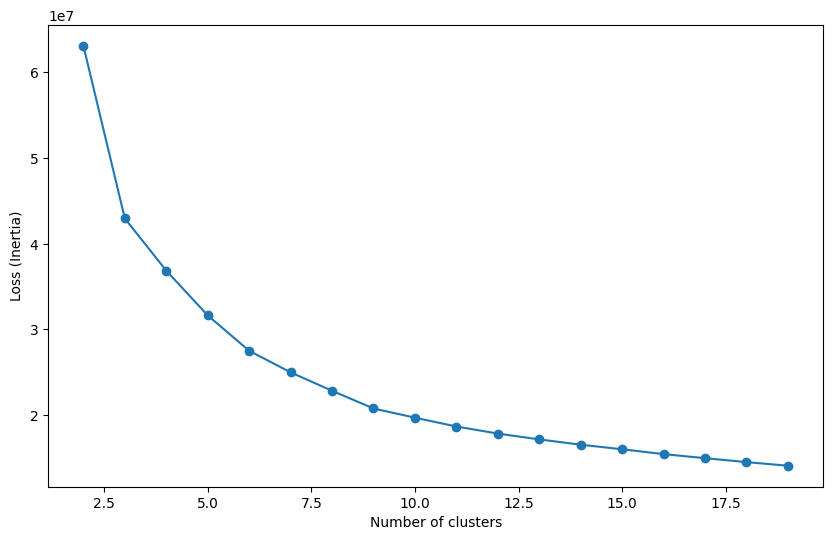

In [36]:
# Collect loss (inertia) for different number of centroids, then plot Elbow curve
inertia = []
for n_clusters in range(2, 20):
    kmeans = KMeans(n_clusters=n_clusters, n_init=10)
    kmeans.fit(df_clustering)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(2, 20), inertia, "o-")
plt.xlabel('Number of clusters')
plt.ylabel('Loss (Inertia)')
plt.show()

In [55]:
kmeans = KMeans(n_clusters=6, n_init=30)
kmeans.fit(df_clustering)
labels = kmeans.labels_

In [57]:
df_imputed[labels==0].describe()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberNonRealEstateLoansOrLines,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,SeriousDlqin2yrs
count,9609.000000,9609.000000,9609.000000,9609.000000,9609.000000,9609.000000,9609.000000,9609.000000,9609.000000,9609.000000,9609.000000
mean,10.662303,42.447185,0.251015,2069.763609,1.124622,6.159746,0.125611,1.025289,0.086065,0.564899,0.083880
std,328.487647,8.469157,0.681056,4079.792463,6.907710,4.096436,0.576333,1.017174,0.387382,1.027554,0.277222
min,0.000000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.044426,37.000000,0.000000,632.000000,0.168907,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.198339,44.000000,0.000000,1646.000000,0.198230,5.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,0.687980,49.000000,0.000000,2785.000000,0.253955,8.000000,0.000000,2.000000,0.000000,1.000000,0.000000
max,22198.000000,57.000000,7.000000,307001.000000,376.353917,34.000000,11.000000,13.000000,7.000000,10.000000,1.000000


In [58]:
df_imputed[labels==1].describe()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberNonRealEstateLoansOrLines,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,SeriousDlqin2yrs
count,38920.000000,38920.000000,38920.000000,38920.000000,3.892000e+04,38920.000000,38920.000000,38920.000000,38920.000000,38920.000000,38920.000000
mean,4.548046,52.444861,0.302929,0.536753,7.654017e+03,8.796608,0.084121,1.312898,0.071660,1.096911,0.069296
std,293.742696,5.286751,0.790213,1.966452,1.882255e+04,5.125762,0.454021,1.232368,0.355953,1.235266,0.253960
min,0.000000,35.000000,0.000000,0.000000,4.751628e+01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.040778,48.000000,0.000000,0.196076,4.094456e+03,5.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,0.185922,52.000000,0.000000,0.331181,6.217093e+03,8.000000,0.000000,1.000000,0.000000,1.000000,0.000000
75%,0.542814,57.000000,0.000000,0.504034,9.177354e+03,11.000000,0.000000,2.000000,0.000000,2.000000,0.000000
max,50708.000000,66.000000,13.000000,121.000000,2.866006e+06,57.000000,13.000000,54.000000,11.000000,10.000000,1.000000


In [59]:
df_imputed[labels==2].describe()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberNonRealEstateLoansOrLines,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,SeriousDlqin2yrs
count,23956.000000,23956.000000,23956.000000,23956.000000,2.395600e+04,23956.000000,23956.000000,23956.000000,23956.000000,23956.000000,23956.000000
mean,2.410403,71.023084,0.153072,0.991085,5.698452e+03,7.860953,0.038905,0.859534,0.030973,0.236778,0.030765
std,96.676120,7.619659,0.549897,3.679225,1.222970e+04,4.899950,0.294792,1.072694,0.215165,0.528749,0.172683
min,0.000000,58.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.012557,65.000000,0.000000,0.056303,2.833970e+03,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.053482,69.000000,0.000000,0.235345,4.578799e+03,7.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,0.250541,76.000000,0.000000,0.457969,7.177707e+03,10.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,8831.000000,103.000000,8.000000,95.300922,1.700580e+06,52.000000,17.000000,23.000000,5.000000,8.000000,1.000000


In [60]:
df_imputed[labels==3].describe()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberNonRealEstateLoansOrLines,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,SeriousDlqin2yrs
count,28871.000000,28871.000000,28871.000000,28871.000000,28871.000000,28871.000000,28871.000000,28871.000000,28871.000000,28871.000000,28871.000000
mean,10.992802,35.408680,0.279173,0.525490,4926.916637,5.771605,0.146445,0.769249,0.088220,0.954920,0.098784
std,305.498521,5.912821,0.714583,2.057688,4366.666265,3.583349,0.632752,1.007398,0.370935,1.191912,0.298377
min,0.000000,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.070473,31.000000,0.000000,0.123422,2621.832963,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.340757,36.000000,0.000000,0.277688,4144.366081,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.847271,40.000000,0.000000,0.467510,6234.619814,8.000000,0.000000,1.000000,0.000000,2.000000,0.000000
max,22000.000000,48.000000,12.000000,122.000000,241184.614008,40.000000,15.000000,21.000000,7.000000,20.000000,1.000000


In [61]:
df_imputed[labels==4].describe()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberNonRealEstateLoansOrLines,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,SeriousDlqin2yrs
count,2.020000e+02,202.000000,202.000000,202.000000,202.000000,202.00000,202.000000,202.0,202.000000,202.000000,202.000000
mean,9.999999e-01,34.717822,97.990099,5.665219,1758.404014,0.00495,97.990099,0.0,97.990099,0.310591,0.534653
std,2.225963e-16,13.392453,0.140720,28.255311,1535.297076,0.07036,0.140720,0.0,0.140720,0.781592,0.500037
min,9.999999e-01,20.000000,96.000000,0.000000,0.000000,0.00000,96.000000,0.0,96.000000,0.000000,0.000000
25%,9.999999e-01,23.250000,98.000000,0.000000,715.664114,0.00000,98.000000,0.0,98.000000,0.000000,0.000000
50%,9.999999e-01,30.000000,98.000000,0.000000,1711.979746,0.00000,98.000000,0.0,98.000000,0.000000,1.000000
75%,9.999999e-01,44.000000,98.000000,0.000000,2270.992234,0.00000,98.000000,0.0,98.000000,0.000000,1.000000
max,9.999999e-01,80.000000,98.000000,255.000000,8507.147269,1.00000,98.000000,0.0,98.000000,5.000000,1.000000


In [62]:
df_imputed[labels==5].describe()

,RevolvingUtilizationOfUnsecuredLines,age,NumberOfTime30-59DaysPastDueNotWorse,DebtRatio,MonthlyIncome,NumberNonRealEstateLoansOrLines,NumberOfTimes90DaysLate,NumberRealEstateLoansOrLines,NumberOfTime60-89DaysPastDueNotWorse,NumberOfDependents,SeriousDlqin2yrs
count,10941.000000,10941.000000,10941.000000,10941.000000,10941.000000,10941.000000,10941.000000,10941.000000,10941.000000,10941.000000,10941.000000
mean,4.564380,66.073211,0.153368,1814.908487,3.609165,7.405539,0.052646,0.987021,0.034458,0.213881,0.029248
std,156.745067,8.113626,0.564865,5223.915301,10.792666,4.758747,0.370739,1.071577,0.235747,0.601216,0.168508
min,0.000000,51.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.017907,60.000000,0.000000,352.000000,0.158746,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.061301,64.000000,0.000000,1285.000000,0.195131,6.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,0.238901,71.000000,0.000000,2357.000000,0.389226,10.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,11553.000000,102.000000,10.000000,329664.000000,128.288790,42.000000,11.000000,23.000000,7.000000,9.000000,1.000000
